# Overview

- With a few coarse maps completed, ran a few pole-to-pole measurments at the same magnet current
- 1. Used last coarse map and picked a line that appeared to have measurments for all X
- 2. First run was off-center, so did another with where I think the center of the pole is ($y=z=125$ mm)
- 3. 3D grid with 1 cm x 1 cm in YZ, step size 1 mm, and the same X values as before. YZ is centered on the pole center.

# Imports

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
#from pandas.api.types import is_numeric_dtype
#from dateutil import parser
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import matplotlib.pyplot as plt
%matplotlib inline

# local imports
from plotting import config_plots, datetime_plt
from load_pattern_slow import *
from Zaber_Magnet_Convert import *
# hallprobecalib package
from hallprobecalib.hpcplots import scatter3d
from mu2e.mu2eplots import mu2e_plot3d

In [3]:
config_plots()

In [4]:
ddir = '/home/ckampa/Dropbox/LogFiles/'

In [5]:
# 6-14-21 15:11 6 x 6 x 51 (new y0, z0)
# plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/pole_to_pole/06-14-21_15:11/'
# plotdir_pattern = plotdir+'pattern/'
# plotdir_pattern = plotdir+'slow/'
# patternfile = '2021-06-14 151201.txt'
# slowfile = '2021-06-14 151158slow.txt'

In [6]:
# 192 A 3D, first pass
# 6-15-21 15:11 6 x 6 x 51 (new y0, z0)
plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/pole_to_pole/06-15-21_14:52/'
plotdir_pattern = plotdir+'pattern/'
plotdir_pattern = plotdir+'slow/'
patternfile = '2021-06-15 145245.txt'
slowfile = '2021-06-15 145241slow.txt'

In [7]:
## FINE SLOW SCAN, 192 A, first
# 6-16-21 11:41 11 x 11 x 51 (2cm x 2cm in YZ)
# plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/pole_to_pole/06-16-21_11:41/'
# plotdir_pattern = plotdir+'pattern/'
# plotdir_pattern = plotdir+'slow/'
# patternfile = '2021-06-16 114150.txt'
# slowfile = '2021-06-16 114146slow.txt'

In [8]:
# # 6-15-21 15:11 6 x 6 x 51 (new y0, z0)
# # plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/pole_to_pole/06-14-21_15:11/'
# # plotdir_pattern = plotdir+'pattern/'
# # plotdir_pattern = plotdir+'slow/'
# patternfile_6_15 = '2021-06-15 073806.txt'
# slowfile_6_15 = '2021-06-15 073803slow.txt'

In [9]:
# patternfile_6_16 = '2021-06-16 074548.txt'
# slowfile_6_16 = '2021-06-16 074544slow.txt'

# Load Data

In [10]:
'''
def load_data(file, pklname=None):
    with open(file, 'r') as f:
        firstline = f.readline().split(',')
        header = [e.strip(' ').strip('\n') for e in firstline]
    df = pd.read_csv(file, names=header, skiprows=1)
    # parse dates and set as index
    dates = [parser.parse(row.Time) for row in df.itertuples()]
    df['Datetime'] = pd.to_datetime(dates)
    df.sort_values(by=['Datetime'], inplace=True)
    df = df.set_index('Datetime')
    # calculate time since beginning in useful units
    df['seconds_delta'] = (df.index - df.index[0]).total_seconds()
    df['hours_delta'] = (df.index - df.index[0]).total_seconds()/60**2
    df['days_delta'] = (df.index - df.index[0]).total_seconds()/(24*60**2)
    # remove bad column ""
    cols = list(df.columns)
    if "" in cols:
        cols.remove("")
        df = df[cols]
    # save to pickle
    if not pklname is None:
        df.to_pickle(pklname)
    return df
'''
_ = None;

In [11]:
df_3d = load_data(ddir+patternfile)

In [12]:
df_3d.tail()

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-16 00:00:29,6/16/2021 12:00:29 AM,192.053137,24.419650,1.049984,0.0,554790.0,428969.0,1641355.0,554790.0,216714.84375,428969.0,167566.015625,1641355.0,641154.296875,32863.0,9.128611,0.380359,62.696875,129.6,127.5
2021-06-16 00:00:45,6/16/2021 12:00:45 AM,192.053193,24.419583,1.049983,0.0,554790.0,428969.0,1646475.0,554790.0,216714.84375,428969.0,167566.015625,1646475.0,643154.296875,32879.0,9.133056,0.380544,62.696875,129.6,125.5
2021-06-16 00:01:00,6/16/2021 12:01:00 AM,192.053080,24.419533,1.049983,0.0,554790.0,428969.0,1651595.0,554790.0,216714.84375,428969.0,167566.015625,1651595.0,645154.296875,32894.0,9.137222,0.380718,62.696875,129.6,123.5
2021-06-16 00:01:15,6/16/2021 12:01:15 AM,192.053250,24.419433,1.049983,0.0,554790.0,428969.0,1656715.0,554790.0,216714.84375,428969.0,167566.015625,1656715.0,647154.296875,32909.0,9.141389,0.380891,62.696875,129.6,121.5
2021-06-16 00:01:30,6/16/2021 12:01:30 AM,192.053080,24.419333,1.049983,0.0,554790.0,428969.0,1661835.0,554790.0,216714.84375,428969.0,167566.015625,1661835.0,649154.296875,32924.0,9.145556,0.381065,62.696875,129.6,119.5


In [13]:
len(df_3d)

1837

In [14]:
51*11*11

6171

In [17]:
554-422

132

In [20]:
216.714-164.917

51.797

In [18]:
df_3d['Zaber_Meas_Micron_X']

Datetime
2021-06-15 14:52:46    164917.96875
2021-06-15 14:53:53    164917.96875
2021-06-15 14:54:08    164917.96875
2021-06-15 14:54:22    164917.96875
2021-06-15 14:54:37    164917.96875
                           ...     
2021-06-16 00:00:29    216714.84375
2021-06-16 00:00:45    216714.84375
2021-06-16 00:01:00    216714.84375
2021-06-16 00:01:15    216714.84375
2021-06-16 00:01:30    216714.84375
Name: Zaber_Meas_Micron_X, Length: 1837, dtype: float64

In [16]:
df_3d['Zaber_Meas_Encoder_X']

Datetime
2021-06-15 14:52:46    422190.0
2021-06-15 14:53:53    422190.0
2021-06-15 14:54:08    422190.0
2021-06-15 14:54:22    422190.0
2021-06-15 14:54:37    422190.0
                         ...   
2021-06-16 00:00:29    554790.0
2021-06-16 00:00:45    554790.0
2021-06-16 00:01:00    554790.0
2021-06-16 00:01:15    554790.0
2021-06-16 00:01:30    554790.0
Name: Zaber_Meas_Encoder_X, Length: 1837, dtype: float64

In [14]:
df = load_data(ddir+patternfile)
df_slow = load_data(ddir+slowfile)

In [95]:
df_slow['Yoke (near pole)']

Datetime
2021-06-15 14:52:41    25.704580
2021-06-15 14:53:21    25.698935
2021-06-15 14:59:08    25.740007
2021-06-15 15:04:06    25.770025
2021-06-15 15:08:58    25.793020
                         ...    
2021-06-16 07:18:54    26.513762
2021-06-16 07:23:54    26.495188
2021-06-16 07:28:54    26.504751
2021-06-16 07:33:54    26.501739
2021-06-16 07:38:54    26.490131
Name: Yoke (near pole), Length: 203, dtype: float64

In [96]:
df_slow['Yoke (center magnet)']

Datetime
2021-06-15 14:52:41    23.455786
2021-06-15 14:53:21    23.456356
2021-06-15 14:59:08    23.472986
2021-06-15 15:04:06    23.515032
2021-06-15 15:08:58    23.528656
                         ...    
2021-06-16 07:18:54    24.178228
2021-06-16 07:23:54    24.130293
2021-06-16 07:28:54    24.112736
2021-06-16 07:33:54    24.188314
2021-06-16 07:38:54    24.162027
Name: Yoke (center magnet), Length: 203, dtype: float64

In [15]:
df

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-15 14:52:46,6/15/2021 2:52:46 PM,192.053080,24.359567,1.050107,0.0,0.0,0.0,0.0,422190.0,164917.96875,416169.0,162566.015625,1649035.0,644154.296875,0.0,0.000000,0.000000,10.900000,124.6,124.5
2021-06-15 14:53:53,6/15/2021 2:53:53 PM,192.053080,24.360333,1.050116,0.0,422190.0,403369.0,1636235.0,422190.0,164917.96875,403369.0,157566.015625,1636235.0,639154.296875,67.0,0.018611,0.000775,10.900000,119.6,129.5
2021-06-15 14:54:08,6/15/2021 2:54:08 PM,192.053080,24.360450,1.050113,0.0,422190.0,403369.0,1641355.0,422190.0,164917.96875,403369.0,157566.015625,1641355.0,641154.296875,82.0,0.022778,0.000949,10.900000,119.6,127.5
2021-06-15 14:54:22,6/15/2021 2:54:22 PM,192.053080,24.360550,1.050111,0.0,422190.0,403369.0,1646475.0,422190.0,164917.96875,403369.0,157566.015625,1646475.0,643154.296875,96.0,0.026667,0.001111,10.900000,119.6,125.5
2021-06-15 14:54:37,6/15/2021 2:54:37 PM,192.053080,24.360583,1.050109,0.0,422190.0,403369.0,1651595.0,422190.0,164917.96875,403369.0,157566.015625,1651595.0,645154.296875,111.0,0.030833,0.001285,10.900000,119.6,123.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-16 00:00:29,6/16/2021 12:00:29 AM,192.053137,24.419650,1.049984,0.0,554790.0,428969.0,1641355.0,554790.0,216714.84375,428969.0,167566.015625,1641355.0,641154.296875,32863.0,9.128611,0.380359,62.696875,129.6,127.5
2021-06-16 00:00:45,6/16/2021 12:00:45 AM,192.053193,24.419583,1.049983,0.0,554790.0,428969.0,1646475.0,554790.0,216714.84375,428969.0,167566.015625,1646475.0,643154.296875,32879.0,9.133056,0.380544,62.696875,129.6,125.5
2021-06-16 00:01:00,6/16/2021 12:01:00 AM,192.053080,24.419533,1.049983,0.0,554790.0,428969.0,1651595.0,554790.0,216714.84375,428969.0,167566.015625,1651595.0,645154.296875,32894.0,9.137222,0.380718,62.696875,129.6,123.5


In [16]:
df_slow[['Zaber_Meas_Encoder_Z', 'Zaber_Meas_Micron_Z']]

,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z
Datetime,,
2021-06-15 14:52:41,644154.296875,1649035.0
2021-06-15 14:53:21,644154.296875,1649035.0
2021-06-15 14:59:08,641154.296875,1641355.0
2021-06-15 15:04:06,649154.296875,1661835.0
2021-06-15 15:08:58,647154.296875,1656715.0
...,...,...
2021-06-16 07:18:54,639154.296875,1636235.0
2021-06-16 07:23:54,639154.296875,1636235.0
2021-06-16 07:28:54,639154.296875,1636235.0


In [17]:
[[f'magnet_{i}_mm'] for i in ['X', 'Y', 'Z']]

[['magnet_X_mm'], ['magnet_Y_mm'], ['magnet_Z_mm']]

In [18]:
df_slow[[f'magnet_{i}_mm' for i in ['X', 'Y', 'Z']]]

,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,
2021-06-15 14:52:41,-89.596887,25.536334,517.031525
2021-06-15 14:53:21,-89.596887,25.536334,517.031525
2021-06-15 14:59:08,-89.596887,25.926959,518.203400
2021-06-15 15:04:06,-89.596887,27.489459,515.078400
2021-06-15 15:08:58,-89.192224,25.145709,515.859650
...,...,...,...
2021-06-16 07:18:54,-89.596887,23.583209,518.984650
2021-06-16 07:23:54,-89.596887,23.583209,518.984650
2021-06-16 07:28:54,-89.596887,23.583209,518.984650


In [19]:
df_slow.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Coil 1', 'Coil 2',
       'LCW in Coil1', 'LCW out Coil 1', 'LCW in Coil 2', 'LCW out Coil 2',
       'Yoke (near pole)', 'Hall Element', 'Floor', 'Roof',
       'Yoke (center magnet)', 'Parameter HVAC sensor', 'Chamber Wall CH13',
       'Chamber Wall CH14', 'Chamber Wall CH15', 'Chamber Wall CH16',
       'Chamber Wall CH17', 'Chamber Wall CH18', 'Chamber Wall CH19',
       'Chamber Wall CH20', 'Desk Ambient', 'Outlet Strip Ambient',
       'Top fo Orange PS Ambient', 'Spare Ambient on desk',
       'TrippLite Ambient 3ft high', 'TrippLite Ambient Floor', 'PS internal',
       'PS Vent1', 'PS Vent2', 'TrippLite HVAC supply',
       'Tripplite HVAC exhaust', 'LCW to PS', 'LCW in barrel', 'ICW in',
       'ICW HE1 out', 'ICW He2 out', 'LCW return magnet', 'LCW to barrel',
       'LCW from PS', 'LCW to magnet', 'NMR [T]', 'NMR [FFT]',
       'Zaber_Meas_Encoder_X', 'Zaber_Meas_Micron_X', 'Zaber_Meas_Encoder_Y',
       'Zaber_Me

In [20]:
#df3d_

In [21]:
#df_ = df.query('`NMR [T]` > 0.7')
# df_ = df.query('`NMR [T]` > 1.13')
# MONDAY
###df3d_ = df.query('`NMR [T]` > 1.13')
# TUESDAY
#df3d_ = df.query('`NMR [T]` > 1.04')
# WEDNESDAY
df3d_ = df.query('`NMR [T]` > 1.04')

In [22]:
len(df3d_)

1837

In [23]:
len(df_3d)

1837

In [24]:
11*11*6

726

In [25]:
11*11*5

605

In [26]:
[len(df3d_[f'Zaber_Pattern_{i}'].unique()) for i in ['X', 'Y', 'Z']]

[52, 7, 7]

In [27]:
np.prod([len(df3d_[f'Zaber_Pattern_{i}'].unique()) for i in ['X', 'Y', 'Z']])

2548

In [28]:
51*6*6

1836

In [29]:
df_3d

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-15 14:52:46,6/15/2021 2:52:46 PM,192.053080,24.359567,1.050107,0.0,0.0,0.0,0.0,422190.0,164917.96875,416169.0,162566.015625,1649035.0,644154.296875,0.0,0.000000,0.000000,10.900000,124.6,124.5
2021-06-15 14:53:53,6/15/2021 2:53:53 PM,192.053080,24.360333,1.050116,0.0,422190.0,403369.0,1636235.0,422190.0,164917.96875,403369.0,157566.015625,1636235.0,639154.296875,67.0,0.018611,0.000775,10.900000,119.6,129.5
2021-06-15 14:54:08,6/15/2021 2:54:08 PM,192.053080,24.360450,1.050113,0.0,422190.0,403369.0,1641355.0,422190.0,164917.96875,403369.0,157566.015625,1641355.0,641154.296875,82.0,0.022778,0.000949,10.900000,119.6,127.5
2021-06-15 14:54:22,6/15/2021 2:54:22 PM,192.053080,24.360550,1.050111,0.0,422190.0,403369.0,1646475.0,422190.0,164917.96875,403369.0,157566.015625,1646475.0,643154.296875,96.0,0.026667,0.001111,10.900000,119.6,125.5
2021-06-15 14:54:37,6/15/2021 2:54:37 PM,192.053080,24.360583,1.050109,0.0,422190.0,403369.0,1651595.0,422190.0,164917.96875,403369.0,157566.015625,1651595.0,645154.296875,111.0,0.030833,0.001285,10.900000,119.6,123.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-16 00:00:29,6/16/2021 12:00:29 AM,192.053137,24.419650,1.049984,0.0,554790.0,428969.0,1641355.0,554790.0,216714.84375,428969.0,167566.015625,1641355.0,641154.296875,32863.0,9.128611,0.380359,62.696875,129.6,127.5
2021-06-16 00:00:45,6/16/2021 12:00:45 AM,192.053193,24.419583,1.049983,0.0,554790.0,428969.0,1646475.0,554790.0,216714.84375,428969.0,167566.015625,1646475.0,643154.296875,32879.0,9.133056,0.380544,62.696875,129.6,125.5
2021-06-16 00:01:00,6/16/2021 12:01:00 AM,192.053080,24.419533,1.049983,0.0,554790.0,428969.0,1651595.0,554790.0,216714.84375,428969.0,167566.015625,1651595.0,645154.296875,32894.0,9.137222,0.380718,62.696875,129.6,123.5


In [30]:
df_slow

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-06-15 14:52:41,6/15/2021 2:52:41 PM,192.053080,24.359567,43.950092,43.787384,30.728090,32.234879,31.215265,36.774059,25.704580,...,162566.015625,416169.0,644154.296875,1649035.0,0.0,0.000000,0.000000,-89.596887,25.536334,517.031525
2021-06-15 14:53:21,6/15/2021 2:53:21 PM,192.053080,24.360117,43.865170,43.787842,30.732109,32.219883,31.324991,36.754265,25.698935,...,162566.015625,416169.0,644154.296875,1649035.0,40.0,0.011111,0.000463,-89.596887,25.536334,517.031525
2021-06-15 14:59:08,6/15/2021 2:59:08 PM,192.053080,24.361983,43.894085,43.810463,30.753052,32.244064,31.246120,36.757126,25.740007,...,163566.015625,418729.0,641154.296875,1641355.0,387.0,0.107500,0.004479,-89.596887,25.926959,518.203400
2021-06-15 15:04:06,6/15/2021 3:04:06 PM,192.053080,24.364933,44.005631,43.837559,30.804922,32.327374,31.248661,36.814102,25.770025,...,167566.015625,428969.0,649154.296875,1661835.0,685.0,0.190278,0.007928,-89.596887,27.489459,515.078400
2021-06-15 15:08:58,6/15/2021 3:08:58 PM,192.053080,24.366417,43.990776,43.793003,30.793377,32.336521,31.048939,36.867195,25.793020,...,161566.015625,413609.0,647154.296875,1656715.0,977.0,0.271389,0.011308,-89.192224,25.145709,515.859650
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-16 07:18:54,6/16/2021 7:18:54 AM,192.053420,24.344967,43.744686,43.653042,30.494242,32.000530,31.078335,36.575192,26.513762,...,157566.015625,403369.0,639154.296875,1636235.0,59173.0,16.436944,0.684873,-89.596887,23.583209,518.984650
2021-06-16 07:23:54,6/16/2021 7:23:54 AM,192.053420,24.344800,43.787621,43.605820,30.463690,32.025581,31.004276,36.544704,26.495188,...,157566.015625,403369.0,639154.296875,1636235.0,59473.0,16.520278,0.688345,-89.596887,23.583209,518.984650
2021-06-16 07:28:54,6/16/2021 7:28:54 AM,192.053193,24.343450,43.782459,43.656822,30.496252,32.017322,30.877991,36.556068,26.504751,...,157566.015625,403369.0,639154.296875,1636235.0,59773.0,16.603611,0.691817,-89.596887,23.583209,518.984650


In [31]:
df_slow['Zaber_Meas_Micron_X']

Datetime
2021-06-15 14:52:41    422190.0
2021-06-15 14:53:21    422190.0
2021-06-15 14:59:08    422190.0
2021-06-15 15:04:06    422190.0
2021-06-15 15:08:58    424842.0
                         ...   
2021-06-16 07:18:54    422190.0
2021-06-16 07:23:54    422190.0
2021-06-16 07:28:54    422190.0
2021-06-16 07:33:54    422190.0
2021-06-16 07:38:54    422190.0
Name: Zaber_Meas_Micron_X, Length: 203, dtype: float64

In [32]:
df_3d.magnet_X_mm.unique()

array([10.9      , 11.9359375, 12.971875 , 14.0078125, 15.04375  ,
       16.0796875, 17.115625 , 18.1515625, 19.1875   , 20.2234375,
       21.259375 , 22.2953125, 23.33125  , 24.3671875, 25.403125 ,
       26.4390625, 27.475    , 28.5109375, 29.546875 , 30.5828125,
       31.61875  , 32.6546875, 33.690625 , 34.7265625, 35.7625   ,
       36.7984375, 37.834375 , 38.8703125, 39.90625  , 40.9421875,
       41.978125 , 43.0140625, 44.05     , 45.0859375, 46.121875 ,
       47.1578125, 48.19375  , 49.2296875, 50.265625 , 51.3015625,
       52.3375   , 53.3734375, 54.409375 , 55.4453125, 56.48125  ,
       57.5171875, 58.553125 , 59.5890625, 60.625    , 61.6609375,
       62.696875 ])

In [33]:
_ = df_3d.query('magnet_X_mm == 10.9')
_.index[-1] - _.index[0]

Timedelta('0 days 00:10:48')

In [34]:
df_slow.index[-1] - df_slow.index[0]

Timedelta('0 days 16:46:13')

In [35]:
_ = df_3d.query('magnet_X_mm == 10.9')
(_.index[-1] - _.index[0])/(df_slow.index[-1] - df_slow.index[0])

0.010733274808275222

In [36]:
(23.8-23.45) * 0.093

0.032550000000000134

In [37]:
6e-5 * 0.0326

1.956e-06

In [38]:
6e-5 * 0.5

3e-05

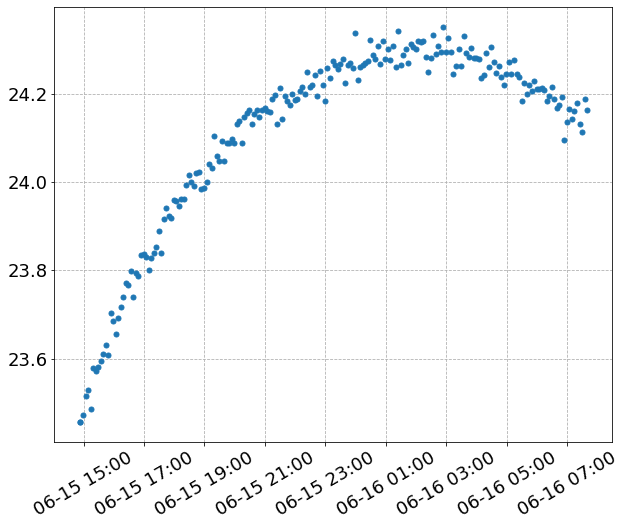

In [39]:
fig, ax = plt.subplots()
ax = datetime_plt(ax, df_slow.index, df_slow['Yoke (center magnet)'])

In [40]:
.1 * 5e-5

5e-06

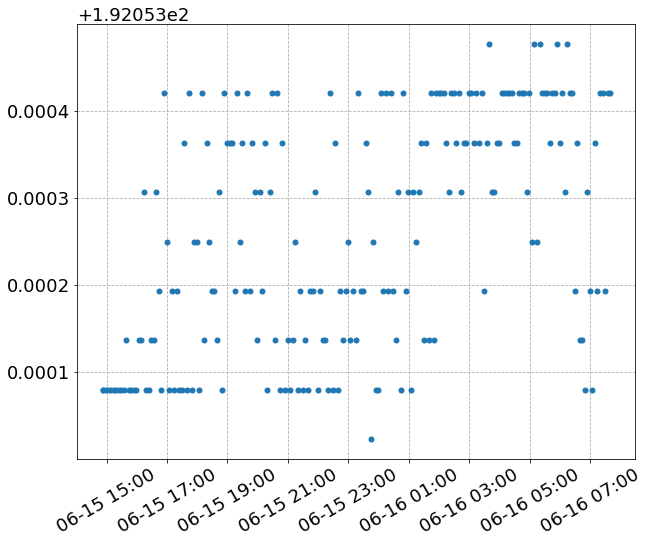

In [41]:
fig, ax = plt.subplots()
ax = datetime_plt(ax, df_slow.index, df_slow['Magnet Current [A]'])

In [42]:
5e-3 * 7e-4

3.5e-06

In [43]:
np.max([df_slow['Coil 1'], df_slow['Coil 2']])

44.6035004

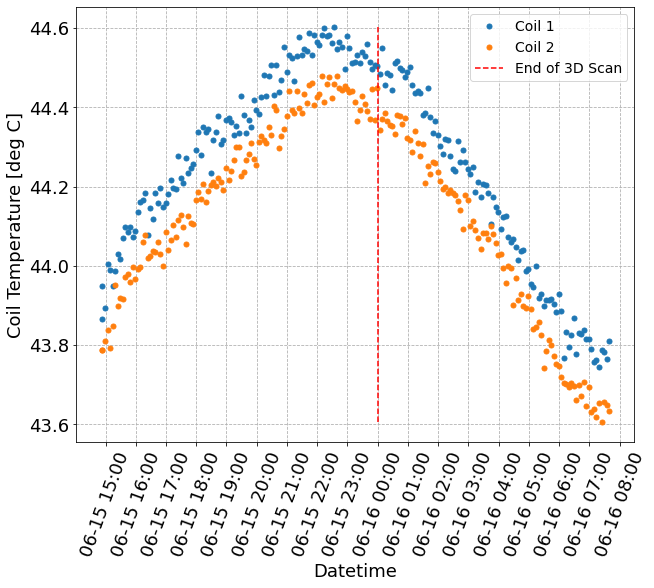

In [44]:
fig, ax = plt.subplots()
ax = datetime_plt(ax, df_slow.index, df_slow['Coil 1'], label='Coil 1', nmaj=10)
ax = datetime_plt(ax, df_slow.index, df_slow['Coil 2'], label='Coil 2', nmaj=10)
yma = np.max([df_slow['Coil 1'], df_slow['Coil 2']])
ymi = np.min([df_slow['Coil 1'], df_slow['Coil 2']])
tf = df_3d.index[-1]
# ax = datetime_plt(ax, [tf, tf], [ymi, yma], label='End of 3D Scan', nmaj=10)
ax.plot([tf, tf], [ymi, yma], 'r--', label='End of 3D Scan')
ax.legend(fontsize=14);
ax.xaxis.set_tick_params(rotation=70)
ax.set_xlabel('Datetime')
ax.set_ylabel('Coil Temperature [deg C]');

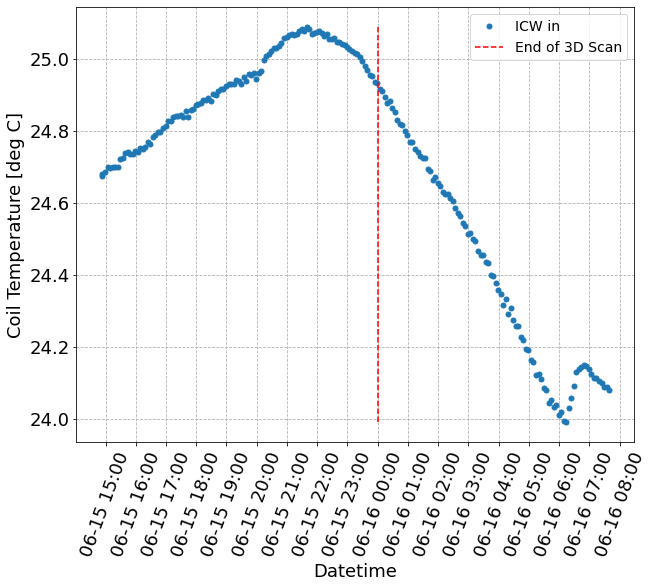

In [45]:
fig, ax = plt.subplots()
ax = datetime_plt(ax, df_slow.index, df_slow['ICW in'], label='ICW in', nmaj=10)
# ax = datetime_plt(ax, df_slow.index, df_slow['Coil 2'], label='Coil 2', nmaj=10)
# yma = np.max([df_slow['Coil 1'], df_slow['Coil 2']])
# ymi = np.min([df_slow['Coil 1'], df_slow['Coil 2']])
yma = np.max(df_slow['ICW in'])
ymi = np.min(df_slow['ICW in'])
# ymi = np.min([df_slow['Coil 1'], df_slow['Coil 2']])

tf = df_3d.index[-1]
# ax = datetime_plt(ax, [tf, tf], [ymi, yma], label='End of 3D Scan', nmaj=10)
ax.plot([tf, tf], [ymi, yma], 'r--', label='End of 3D Scan')
ax.legend(fontsize=14);
ax.xaxis.set_tick_params(rotation=70)
ax.set_xlabel('Datetime')
ax.set_ylabel('Coil Temperature [deg C]');

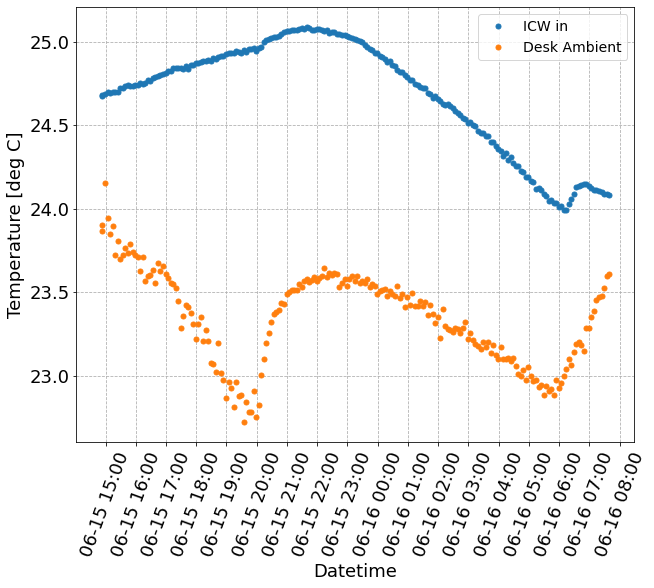

In [46]:
fig, ax = plt.subplots()
ax = datetime_plt(ax, df_slow.index, df_slow['ICW in'], label='ICW in', nmaj=10)
ax = datetime_plt(ax, df_slow.index, df_slow['Desk Ambient'], label='Desk Ambient', nmaj=10)
# yma = np.max([df_slow['Coil 1'], df_slow['Coil 2']])
# ymi = np.min([df_slow['Coil 1'], df_slow['Coil 2']])
# tf = df_3d.index[-1]
# # ax = datetime_plt(ax, [tf, tf], [ymi, yma], label='End of 3D Scan', nmaj=10)
# ax.plot([tf, tf], [ymi, yma], 'r--', label='End of 3D Scan')
ax.legend(fontsize=14);
ax.xaxis.set_tick_params(rotation=70)
ax.set_xlabel('Datetime')
ax.set_ylabel('Temperature [deg C]');

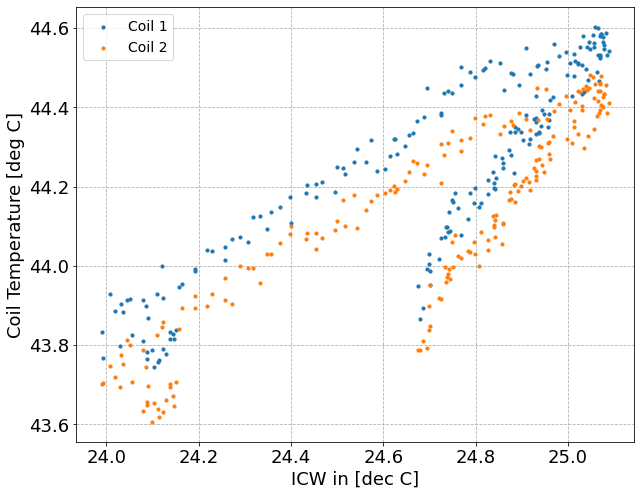

In [47]:
fig, ax = plt.subplots()
ax.scatter(df_slow['ICW in'], df_slow['Coil 1'], label='Coil 1', s=10)
ax.scatter(df_slow['ICW in'], df_slow['Coil 2'], label='Coil 2', s=10)
# ax = datetime_plt(ax, df_slow.index, df_slow['ICW in'], label='ICW in', nmaj=10)
# ax = datetime_plt(ax, df_slow.index, df_slow['Desk Ambient'], label='Desk Ambient', nmaj=10)
# yma = np.max([df_slow['Coil 1'], df_slow['Coil 2']])
# ymi = np.min([df_slow['Coil 1'], df_slow['Coil 2']])
# tf = df_3d.index[-1]
# # ax = datetime_plt(ax, [tf, tf], [ymi, yma], label='End of 3D Scan', nmaj=10)
# ax.plot([tf, tf], [ymi, yma], 'r--', label='End of 3D Scan')
ax.legend(fontsize=14);
#ax.xaxis.set_tick_params(rotation=70)
ax.set_xlabel('ICW in [dec C]')
ax.set_ylabel('Coil Temperature [deg C]');

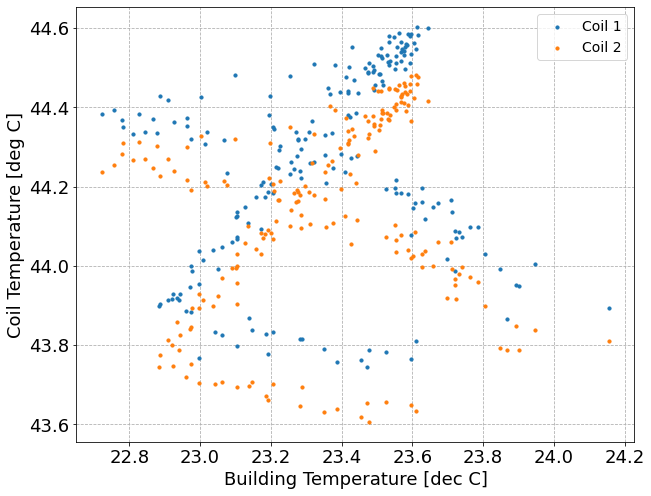

In [48]:
fig, ax = plt.subplots()
ax.scatter(df_slow['Desk Ambient'], df_slow['Coil 1'], label='Coil 1', s=10)
ax.scatter(df_slow['Desk Ambient'], df_slow['Coil 2'], label='Coil 2', s=10)
# ax = datetime_plt(ax, df_slow.index, df_slow['ICW in'], label='ICW in', nmaj=10)
# ax = datetime_plt(ax, df_slow.index, df_slow['Desk Ambient'], label='Desk Ambient', nmaj=10)
# yma = np.max([df_slow['Coil 1'], df_slow['Coil 2']])
# ymi = np.min([df_slow['Coil 1'], df_slow['Coil 2']])
# tf = df_3d.index[-1]
# # ax = datetime_plt(ax, [tf, tf], [ymi, yma], label='End of 3D Scan', nmaj=10)
# ax.plot([tf, tf], [ymi, yma], 'r--', label='End of 3D Scan')
ax.legend(fontsize=14);
#ax.xaxis.set_tick_params(rotation=70)
ax.set_xlabel('Building Temperature [dec C]')
ax.set_ylabel('Coil Temperature [deg C]');

In [49]:
tf

Timestamp('2021-06-16 00:01:30')

In [50]:
df_slow['Magnet Current [A]']

Datetime
2021-06-15 14:52:41    192.053080
2021-06-15 14:53:21    192.053080
2021-06-15 14:59:08    192.053080
2021-06-15 15:04:06    192.053080
2021-06-15 15:08:58    192.053080
                          ...    
2021-06-16 07:18:54    192.053420
2021-06-16 07:23:54    192.053420
2021-06-16 07:28:54    192.053193
2021-06-16 07:33:54    192.053420
2021-06-16 07:38:54    192.053420
Name: Magnet Current [A], Length: 203, dtype: float64

In [51]:
# WRONG COORDINATES

In [52]:
#mag_mm_to_zaber_ADC(416169, 'Y')

In [53]:
# zaber_ADC_to_mag_mm(416169, 'Y')

- This is wrong and needs to be fixed. Should look at carefully soon. Will want it working for presenting results.

In [54]:
# TEST FROM NEW POSITION

In [55]:
ADC_to_mm(416169, 'Y')

124.6

In [56]:
ADC_to_mm(417000, 'Y'), ADC_to_mm(417250, 'Y')

(124.92460937499999, 125.02226562499999)

In [57]:
ADC_to_mm(1649035, 'Z')

124.5

In [58]:
ADC_to_mm(1648000, 'Z'), ADC_to_mm(1647500, 'Z')

(124.904296875, 125.099609375)

In [59]:
ADC_to_mm(1650000, 'Z')

124.123046875

In [60]:
mm_to_ADC(150, 'Z')

1583755.0

In [61]:
mm_to_ADC(227, 'Z') # 3 mm below brass #2

1386635.0

In [62]:
mm_to_ADC(53, 'Z') # 3 mm above brass # 1

1832075.0

- Z limits are off. Should inspect visually after next degauss.

In [63]:
mm_to_ADC(51+spacer_R, 'Y')

NameError: name 'spacer_R' is not defined

In [64]:
mm_to_ADC(226+spacer_R, 'Y')

NameError: name 'spacer_R' is not defined

In [65]:
(700495-637825) * mm_per_ADC

24.48046875

- Y limits also off. Looks to be about the amount from NMR sample to bigger sharpie line. Measure this.

In [66]:
mm_to_ADC(0, 'X')

394286.0

In [67]:
mm_to_ADC(75, 'X')

586286.0

In [68]:
mm_to_ADC(75, 'X') - mm_to_ADC(0, 'X')

192000.0

In [69]:
# actual limits
(554838 - 422190)

132648

In [70]:
(554838 - 422190) * mm_per_ADC

51.815625000000004

In [71]:
(554838 - 422190) * mm_per_ADC + 12-2 + 2 + 10

73.81562500000001

In [72]:
### Testing new columns

In [73]:
len(df['magnet_X_mm'].unique())

51

# Plotting Functions

## Planes of NMR Data

In [74]:
def scatter_plane(df, plane_str, plane_val, X, Y, plotfile=None):
    df_ = df.query(f'magnet_{plane_str}_mm == {plane_val}').copy()
    ADC = df_[f'Zaber_Meas_Encoder_{plane_str}'].iloc[0]
    # plot
    fig, ax = plt.subplots()
    sc = ax.scatter(df_[f'magnet_{X}_mm'], df_[f'magnet_{Y}_mm'], c=df_['NMR [T]'], s=25)
    cb = fig.colorbar(sc, label='NMR [T]')
    ax.set_xlabel(f'{X} [mm]')
    ax.set_ylabel(f'{Y} [mm]')
    fig.suptitle(f'{plane_str} = {plane_val:.2f} [mm] = {int(ADC)} [ADC]')
    
    if not plotfile is None:
        fig.savefig(plotfile+'.pdf', facecolor='white', transparent=False)
        fig.savefig(plotfile+'.png', facecolor='white', transparent=False)
    return fig, ax
    
#     xmin = df[f'Zaber_Meas_{mm}_X'].min()
#     df_ = df.query(f'`Zaber_Pattern_X` == {xval}').copy()
#     x_mm = df_[f'Zaber_Meas_{mm}_X'].values[0]
#     ymin = df_[f'Zaber_Meas_{mm}_Y'].min()
#     zmin = -df_[f'Zaber_Meas_{mm}_Z'].max()
#     # plot
#     fig, ax = plt.subplots()
#     sc = ax.scatter(1e-3*(df_[f'Zaber_Meas_{mm}_Y']-ymin), 1e-3*(-df_[f'Zaber_Meas_{mm}_Z']+zmin),
#                     c=df_['NMR [T]'], s=25)
#     cb = fig.colorbar(sc, label='NMR [T]')
#     ax.set_xlabel('Zaber Y [mm]')
#     ax.set_ylabel('Zaber Z [mm]')
#     fig.suptitle(f'Zaber X = {1e-3*(x_mm - xmin)} [mm] = {xval} [ADC]')
# #     fig.suptitle(f'Zaber Encoder X = {xval} [ADC]')
#     #ax.set_facecolor('white')
#     if not plotfile is None:
#         fig.savefig(plotfile+'.pdf', facecolor='white', transparent=False)
#         fig.savefig(plotfile+'.png', facecolor='white', transparent=False)
#     return fig, ax

In [78]:
#df_6_15['magnet_Z_mm'].unique()

In [76]:
df_3d['magnet_Z_mm'].unique()

array([124.5, 129.5, 127.5, 125.5, 123.5, 121.5, 119.5])

In [ ]:
#df_3d['magnet_Z_mm'].unique()

In [79]:
df_3d_ = df_3d.query('magnet_Z_mm == 125.5')

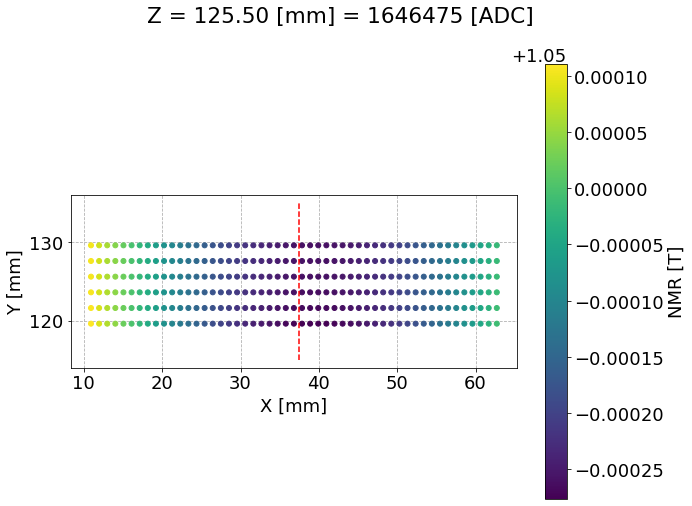

In [81]:
# fig, ax = scatter_plane(df3d_, 'Z', 129.5, 'X', 'Y')
fig, ax = scatter_plane(df3d_, 'Z', 125.5, 'X', 'Y')
ax.plot([37.5, 37.5],[115, 135], 'r--')
ax.set_aspect('equal')

In [1364]:
df_3d['magnet_X_mm'].unique()

array([10.9      , 11.9359375, 12.971875 , 14.0078125, 15.04375  ,
       16.0796875, 17.115625 , 18.1515625, 19.1875   , 20.2234375,
       21.259375 , 22.2953125, 23.33125  , 24.3671875, 25.403125 ,
       26.4390625, 27.475    , 28.5109375, 29.546875 , 30.5828125,
       31.61875  , 32.6546875, 33.690625 , 34.7265625, 35.7625   ,
       36.7984375, 37.834375 , 38.8703125, 39.90625  , 40.9421875,
       41.978125 , 43.0140625, 44.05     , 45.0859375, 46.121875 ,
       47.1578125, 48.19375  , 49.2296875, 50.265625 , 51.3015625,
       52.3375   , 53.3734375, 54.409375 , 55.4453125, 56.48125  ,
       57.5171875, 58.553125 , 59.5890625, 60.625    , 61.6609375,
       62.696875 ])

In [1365]:
df_3d.magnet_Z_mm.unique()

array([134.5, 132.5, 130.5, 128.5, 126.5, 124.5, 122.5, 120.5, 118.5,
       116.5, 114.5])

In [83]:
df3d_2 = df3d_.query('(magnet_Z_mm == 129.50) & (magnet_X_mm < 37.5)').copy()
#df3d_2 = df3d_.query('(magnet_Z_mm == 129.50) & (magnet_X_mm < 54.0)').copy()
#df3d_2 = df3d_.query('(magnet_Z_mm == 129.50)').copy()
##df3d_2 = df3d_.query('(magnet_Z_mm == 134.5) & (magnet_X_mm < 16.0)').iloc[1:].copy()
###df3d_2 = df3d_.query('(magnet_Z_mm == 134.5) & (10.9 < magnet_X_mm < 60.0)').copy()
##df3d_2 = df3d_.query('(magnet_Z_mm == 124.5) & (10.9 < magnet_X_mm < 60.0)').copy()
# df3d_2 = df3d_.query('(magnet_Z_mm == 125.5)').copy()
####df3d_2 = df3d_.query('(magnet_Z_mm == 124.5)').copy()

In [84]:
df3d_2

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-15 14:53:53,6/15/2021 2:53:53 PM,192.053080,24.360333,1.050116,0.0,422190.0,403369.0,1636235.0,422190.0,164917.96875,403369.0,157566.015625,1636235.0,639154.296875,67.0,0.018611,0.000775,10.900000,119.6,129.5
2021-06-15 14:55:26,6/15/2021 2:55:26 PM,192.053137,24.360767,1.050114,0.0,422190.0,408489.0,1636235.0,422190.0,164917.96875,408489.0,159566.015625,1636235.0,639154.296875,160.0,0.044444,0.001852,10.900000,121.6,129.5
2021-06-15 14:57:00,6/15/2021 2:57:00 PM,192.053080,24.361317,1.050112,0.0,422190.0,413609.0,1636235.0,422190.0,164917.96875,413609.0,161566.015625,1636235.0,639154.296875,254.0,0.070556,0.002940,10.900000,123.6,129.5
2021-06-15 14:58:35,6/15/2021 2:58:35 PM,192.053080,24.361800,1.050110,0.0,422190.0,418729.0,1636235.0,422190.0,164917.96875,418729.0,163566.015625,1636235.0,639154.296875,349.0,0.096944,0.004039,10.900000,125.6,129.5
2021-06-15 15:00:42,6/15/2021 3:00:42 PM,192.053080,24.362867,1.050109,0.0,422190.0,423849.0,1636235.0,422190.0,164917.96875,423849.0,165566.015625,1636235.0,639154.296875,476.0,0.132222,0.005509,10.900000,127.6,129.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-15 19:24:17,6/15/2021 7:24:17 PM,192.053250,24.405367,1.049725,0.0,488490.0,408489.0,1636235.0,488490.0,190816.40625,408489.0,159566.015625,1636235.0,639154.296875,16291.0,4.525278,0.188553,36.798437,121.6,129.5
2021-06-15 19:25:53,6/15/2021 7:25:53 PM,192.053193,24.405200,1.049731,0.0,488490.0,413609.0,1636235.0,488490.0,190816.40625,413609.0,161566.015625,1636235.0,639154.296875,16387.0,4.551944,0.189664,36.798437,123.6,129.5
2021-06-15 19:27:29,6/15/2021 7:27:29 PM,192.053420,24.405217,1.049734,0.0,488490.0,418729.0,1636235.0,488490.0,190816.40625,418729.0,163566.015625,1636235.0,639154.296875,16483.0,4.578611,0.190775,36.798437,125.6,129.5


In [85]:
len(df3d_), len(df3d_2)

(1837, 156)

In [86]:
len(df3d_2.magnet_X_mm.unique()), len(df3d_2.magnet_Y_mm.unique())

(26, 6)

In [87]:
len(df3d_2.magnet_X_mm.unique()) * len(df3d_2.magnet_Y_mm.unique())

156

In [88]:
fig = mu2e_plot3d(df3d_2, 'magnet_X_mm', 'magnet_Y_mm', 'NMR [T]', "`NMR [T]` > 0.", mode='plotly')

/home/ckampa/anaconda3/envs/mu2e/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:173: DeprecationWarning:

plotly.graph_objs.ColorBar is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.marker.ColorBar
  - plotly.graph_objs.surface.ColorBar
  - etc.




In [89]:
df_3d['magnet_X_mm'].min(), df_3d['magnet_X_mm'].max()

(10.9, 62.696875)

In [90]:
df_3d['magnet_X_mm'].max() - df_3d['magnet_X_mm'].min()

51.796875

In [91]:
fig.show()

In [1375]:
df3d_

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-16 11:41:51,6/16/2021 11:41:51 AM,192.053363,24.303133,1.050143,0.0,0.0,0.0,0.0,422190.0,164917.96875,390569.0,152566.015625,1623435.0,634154.296875,0.0,0.000000,0.000000,10.900000,114.6,134.5
2021-06-16 11:43:46,6/16/2021 11:43:46 AM,192.053477,24.302533,1.050143,0.0,422190.0,390569.0,1623435.0,422190.0,164917.96875,390569.0,152566.015625,1623435.0,634154.296875,115.0,0.031944,0.001331,10.900000,114.6,134.5
2021-06-16 11:44:01,6/16/2021 11:44:01 AM,192.053420,24.302517,1.050139,0.0,422190.0,390569.0,1628555.0,422190.0,164917.96875,390569.0,152566.015625,1628555.0,636154.296875,130.0,0.036111,0.001505,10.900000,114.6,132.5
2021-06-16 11:44:15,6/16/2021 11:44:15 AM,192.053420,24.302483,1.050135,0.0,422190.0,390569.0,1633675.0,422190.0,164917.96875,390569.0,152566.015625,1633675.0,638154.296875,144.0,0.040000,0.001667,10.900000,114.6,130.5
2021-06-16 11:44:30,6/16/2021 11:44:30 AM,192.053477,24.302550,1.050132,0.0,422190.0,390569.0,1638795.0,422190.0,164917.96875,390569.0,152566.015625,1638795.0,640154.296875,159.0,0.044167,0.001840,10.900000,114.6,128.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-17 16:28:57,6/17/2021 4:28:57 PM,192.053760,24.329867,1.050030,0.0,554790.0,441769.0,1654155.0,554790.0,216714.84375,441769.0,172566.015625,1654155.0,646154.296875,103626.0,28.785000,1.199375,62.696875,134.6,122.5
2021-06-17 16:29:13,6/17/2021 4:29:13 PM,192.053703,24.329967,1.050030,0.0,554790.0,441769.0,1659275.0,554790.0,216714.84375,441769.0,172566.015625,1659275.0,648154.296875,103642.0,28.789444,1.199560,62.696875,134.6,120.5
2021-06-17 16:29:28,6/17/2021 4:29:28 PM,192.053760,24.330083,1.050030,0.0,554790.0,441769.0,1664395.0,554790.0,216714.84375,441769.0,172566.015625,1664395.0,650154.296875,103657.0,28.793611,1.199734,62.696875,134.6,118.5


In [1376]:
# checking yaw and roll corrections

In [1377]:
phi = -0.0886 # yaw
theta = 0.0957 # roll
x0 = 10.1 # distance from pole 1

In [1378]:
df3d_['magnet_Y_prime_mm'] = df3d_['magnet_Y_mm'] + (df3d_['magnet_X_mm']-x0) * phi
df3d_['magnet_Z_prime_mm'] = df3d_['magnet_Z_mm'] + (df3d_['magnet_X_mm']-x0) * theta

In [1379]:
df3d_.magnet_X_mm.unique()

array([10.9      , 11.9359375, 12.971875 , 14.0078125, 15.04375  ,
       16.0796875, 17.115625 , 18.1515625, 19.1875   , 20.2234375,
       21.259375 , 22.2953125, 23.33125  , 24.3671875, 25.403125 ,
       26.4390625, 27.475    , 28.5109375, 29.546875 , 30.5828125,
       31.61875  , 32.6546875, 33.690625 , 34.7265625, 35.7625   ,
       36.7984375, 37.834375 , 38.8703125, 39.90625  , 40.9421875,
       41.978125 , 43.0140625, 44.05     , 45.0859375, 46.121875 ,
       47.1578125, 48.19375  , 49.2296875, 50.265625 , 51.3015625,
       52.3375   , 53.3734375, 54.409375 , 55.4453125, 56.48125  ,
       57.5171875, 58.553125 , 59.5890625, 60.625    , 61.6609375,
       62.696875 ])

BEFORE CORRECTION
AFTER CORRECTION


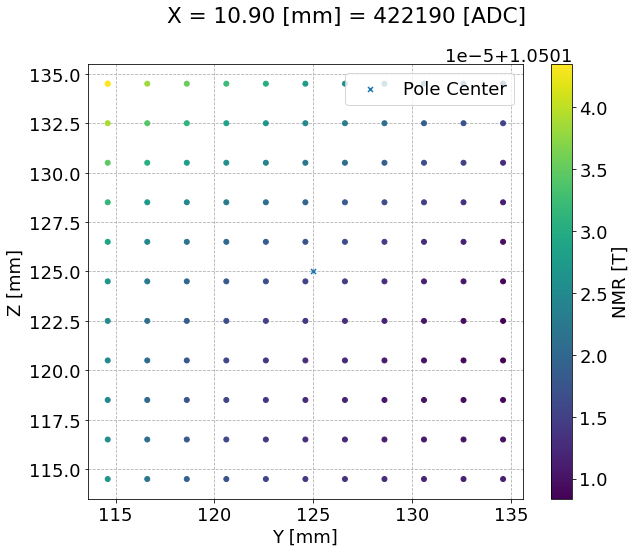

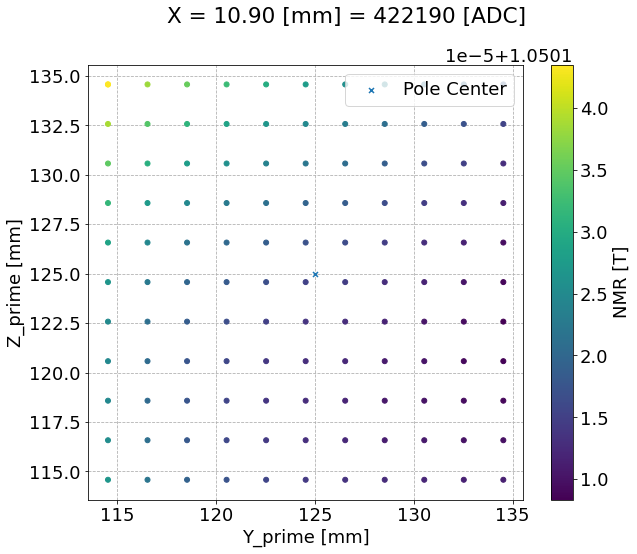

In [1096]:
# x = 10.9 -- no correction
print('BEFORE CORRECTION')
fig, ax = scatter_plane(df3d_, 'X', 10.9, 'Y', 'Z' )
ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
ax.set_aspect('equal')
ax.legend();

print('AFTER CORRECTION')
fig, ax = scatter_plane(df3d_, 'X', 10.9, 'Y_prime', 'Z_prime' )
ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
ax.set_aspect('equal')
ax.legend();

BEFORE CORRECTION
AFTER CORRECTION


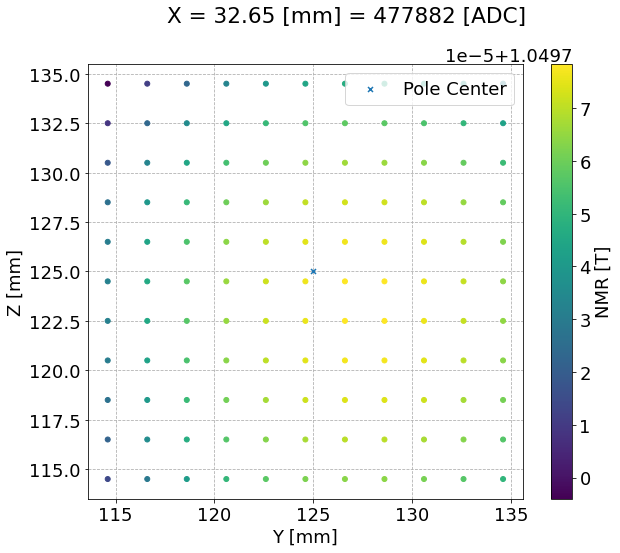

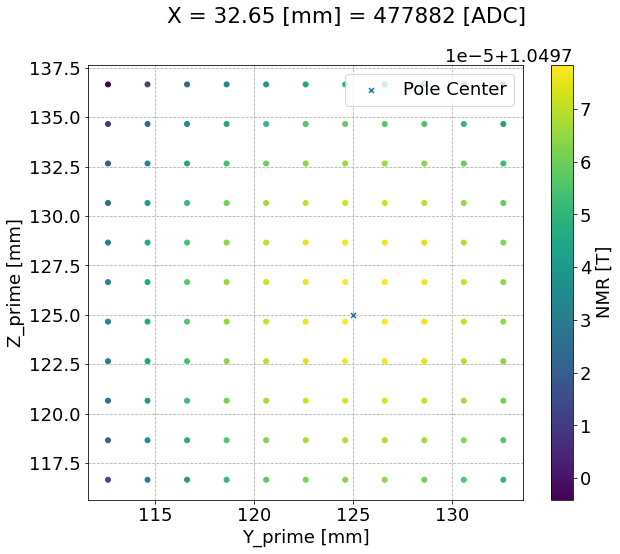

In [1097]:
# x = 32.6546875 -- correction from measurement point
print('BEFORE CORRECTION')
fig, ax = scatter_plane(df3d_, 'X', 32.6546875, 'Y', 'Z' )
ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
ax.set_aspect('equal')
ax.legend();

print('AFTER CORRECTION')
fig, ax = scatter_plane(df3d_, 'X', 32.6546875, 'Y_prime', 'Z_prime' )
ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
ax.set_aspect('equal')
ax.legend();

BEFORE CORRECTION
AFTER CORRECTION


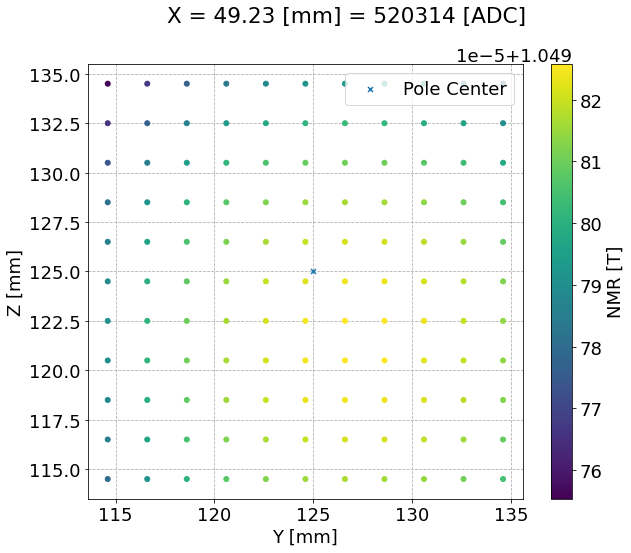

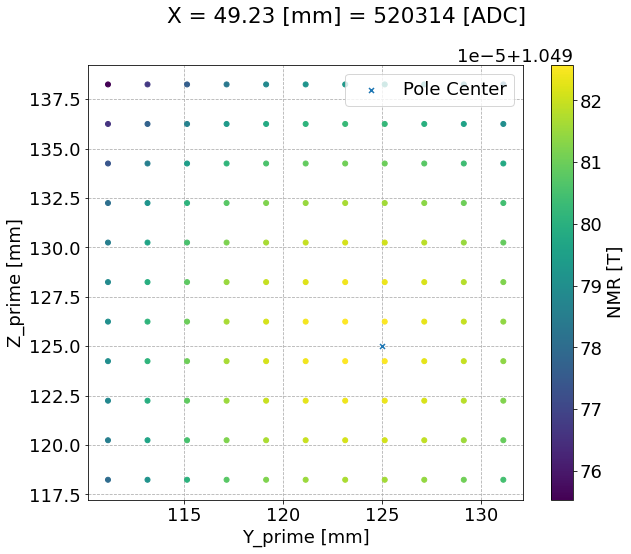

In [1098]:
# x = 49.2296875 -- correction from measurement point
print('BEFORE CORRECTION')
fig, ax = scatter_plane(df3d_, 'X', 49.2296875, 'Y', 'Z' )
ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
ax.set_aspect('equal')
ax.legend();

print('AFTER CORRECTION')
fig, ax = scatter_plane(df3d_, 'X', 49.2296875, 'Y_prime', 'Z_prime' )
ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
ax.set_aspect('equal')
ax.legend();

BEFORE CORRECTION
AFTER CORRECTION


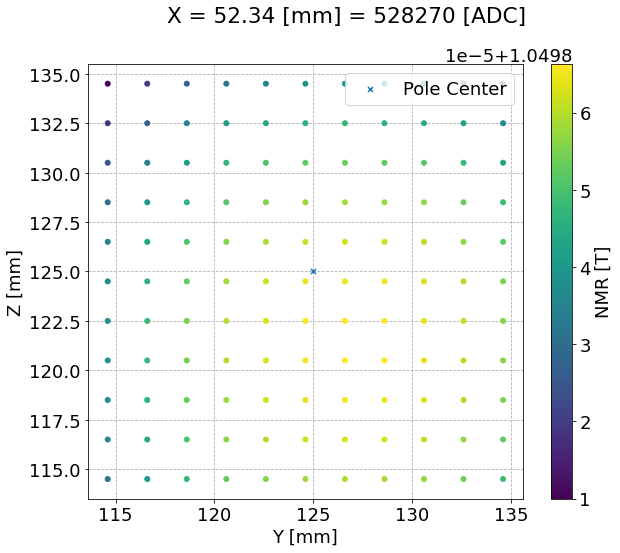

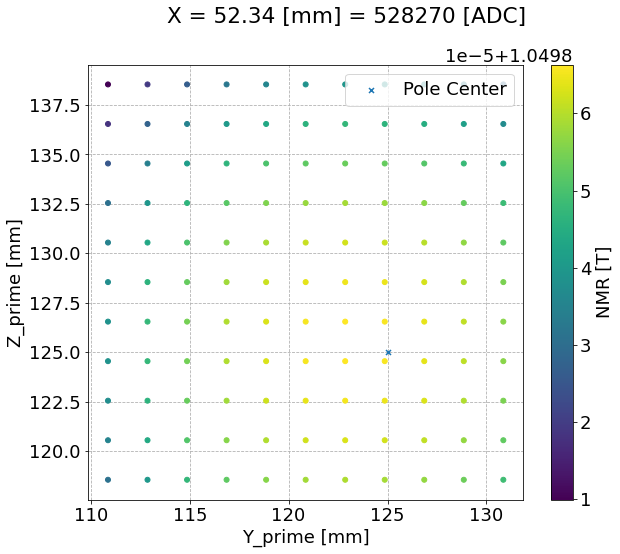

In [1099]:
# x = 52.696875 -- correction from measurement point
print('BEFORE CORRECTION')
fig, ax = scatter_plane(df3d_, 'X', 52.3375, 'Y', 'Z' )
ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
ax.set_aspect('equal')
ax.legend();

print('AFTER CORRECTION')
fig, ax = scatter_plane(df3d_, 'X', 52.3375, 'Y_prime', 'Z_prime' )
ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
ax.set_aspect('equal')
ax.legend();

In [650]:
df3d_

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,...,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm,magnet_Y_prime_mm,magnet_Z_prime_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-06-16 11:41:51,6/16/2021 11:41:51 AM,192.053363,24.303133,1.050143,0.0,0.0,0.0,0.0,422190.0,164917.96875,...,1623435.0,634154.296875,0.0,0.000000,0.000000,10.900000,114.6,134.5,114.529120,134.576560
2021-06-16 11:43:46,6/16/2021 11:43:46 AM,192.053477,24.302533,1.050143,0.0,422190.0,390569.0,1623435.0,422190.0,164917.96875,...,1623435.0,634154.296875,115.0,0.031944,0.001331,10.900000,114.6,134.5,114.529120,134.576560
2021-06-16 11:44:01,6/16/2021 11:44:01 AM,192.053420,24.302517,1.050139,0.0,422190.0,390569.0,1628555.0,422190.0,164917.96875,...,1628555.0,636154.296875,130.0,0.036111,0.001505,10.900000,114.6,132.5,114.529120,132.576560
2021-06-16 11:44:15,6/16/2021 11:44:15 AM,192.053420,24.302483,1.050135,0.0,422190.0,390569.0,1633675.0,422190.0,164917.96875,...,1633675.0,638154.296875,144.0,0.040000,0.001667,10.900000,114.6,130.5,114.529120,130.576560
2021-06-16 11:44:30,6/16/2021 11:44:30 AM,192.053477,24.302550,1.050132,0.0,422190.0,390569.0,1638795.0,422190.0,164917.96875,...,1638795.0,640154.296875,159.0,0.044167,0.001840,10.900000,114.6,128.5,114.529120,128.576560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-16 13:37:56,6/16/2021 1:37:56 PM,192.053420,24.307633,1.050056,0.0,430146.0,411049.0,1649035.0,430146.0,168025.78125,...,1649035.0,644154.296875,6965.0,1.934722,0.080613,14.007812,122.6,124.5,122.253768,124.873978
2021-06-16 13:38:12,6/16/2021 1:38:12 PM,192.053477,24.307750,1.050055,0.0,430146.0,411049.0,1654155.0,430146.0,168025.78125,...,1654155.0,646154.296875,6981.0,1.939167,0.080799,14.007812,122.6,122.5,122.253768,122.873978
2021-06-16 13:38:27,6/16/2021 1:38:27 PM,192.053420,24.307800,1.050055,0.0,430146.0,411049.0,1659275.0,430146.0,168025.78125,...,1659275.0,648154.296875,6996.0,1.943333,0.080972,14.007812,122.6,120.5,122.253768,120.873978


<ipython-input-981-e34682e5b772>:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



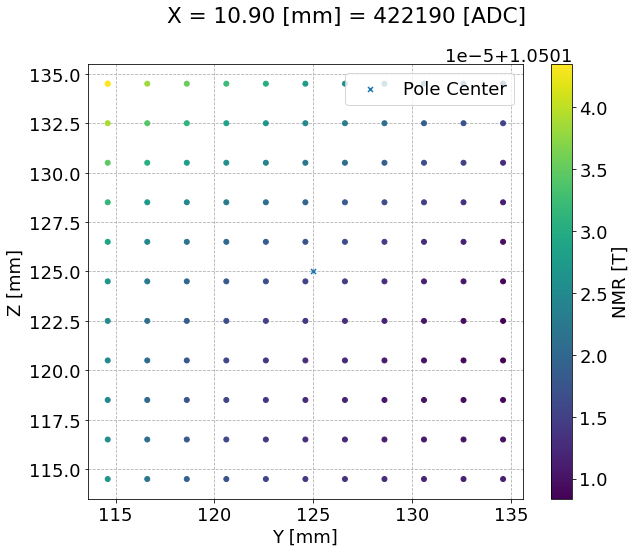

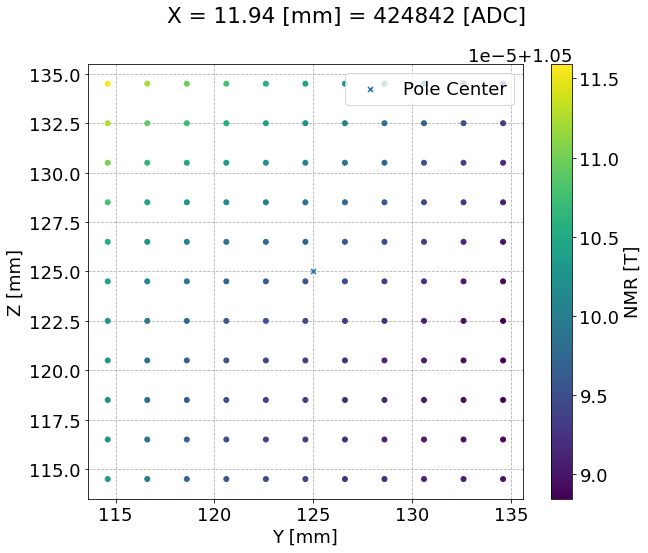

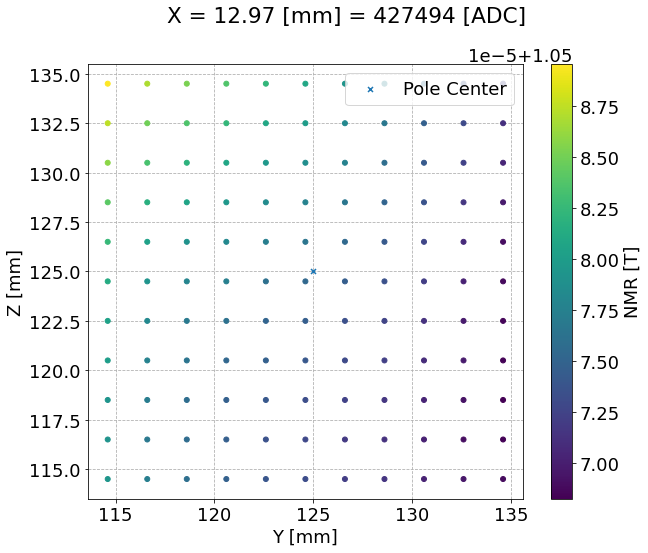

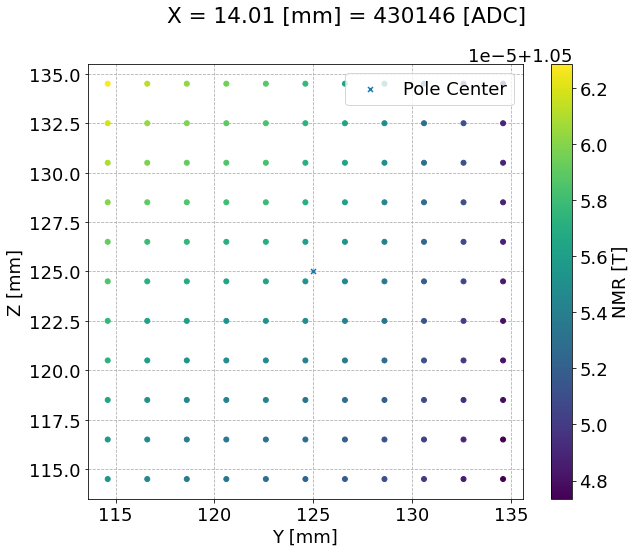

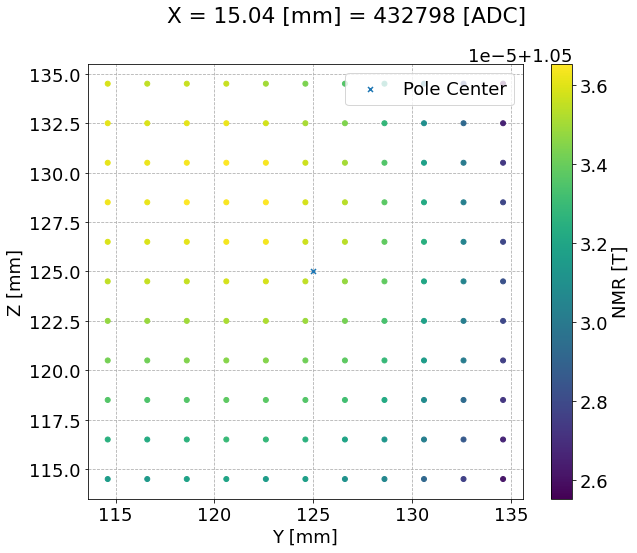

...

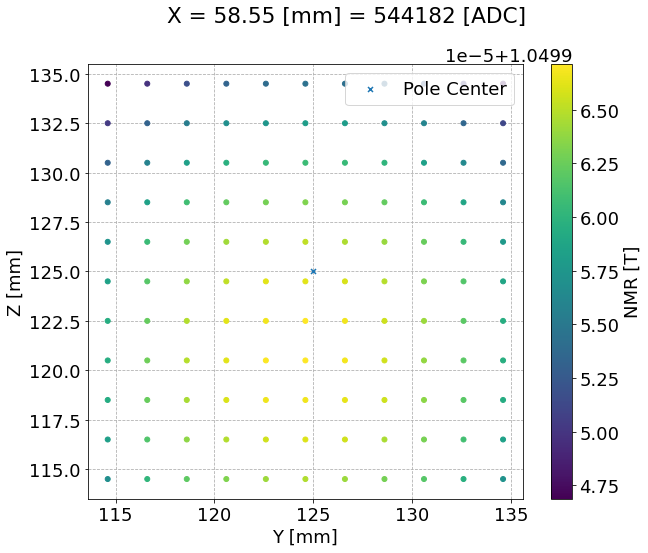

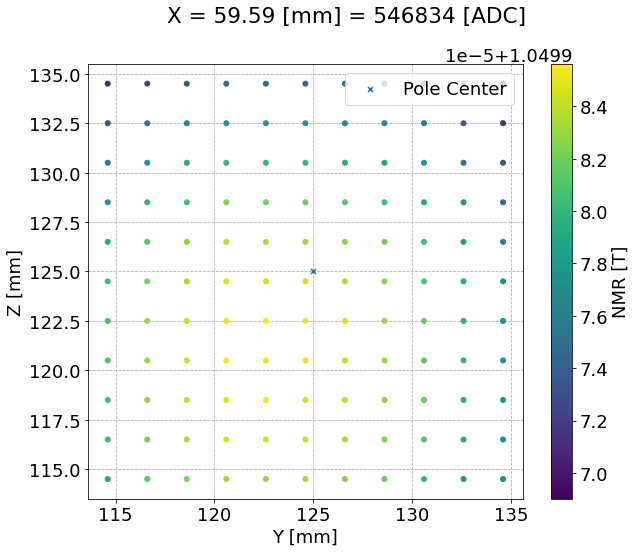

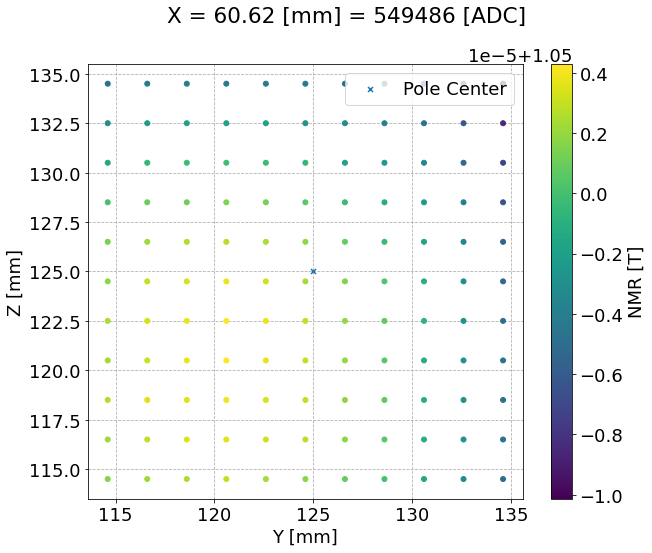

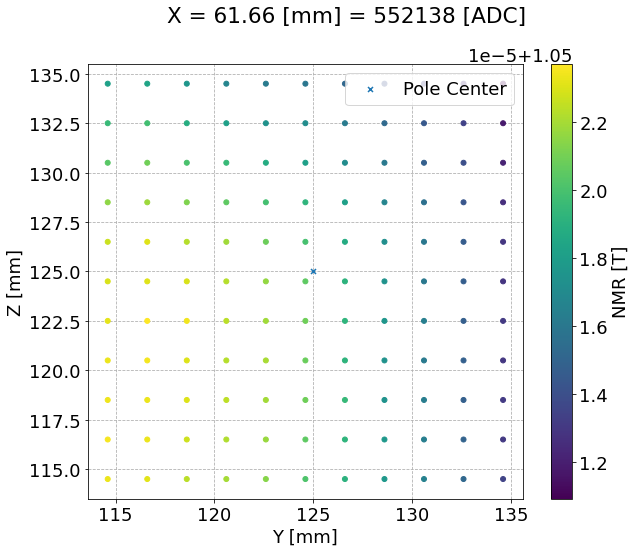

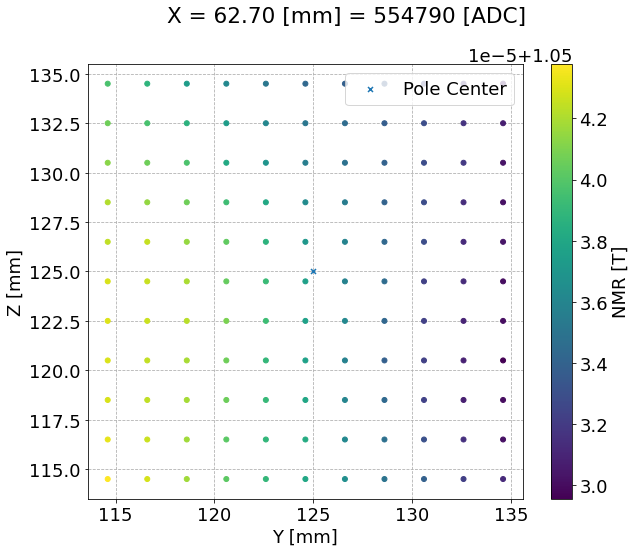

In [1100]:
for x_ in df3d_.magnet_X_mm.unique():
    fig, ax = scatter_plane(df3d_, 'X', x_, 'Y', 'Z')
    ax.scatter([125.],[125.], s=25, marker='x', label='Pole Center')
    ax.set_aspect('equal')
    ax.legend();

In [1101]:
len(df_3d), len(df3d_)

(6172, 6172)

In [1102]:
#from hallprobecalib.hpcplots import scatter3d

In [92]:
fig = scatter3d([df3d_['magnet_X_mm']], [df3d_['magnet_Y_mm']], [df3d_['magnet_Z_mm']], [df3d_['NMR [T]']], aspect_auto=False)

In [93]:
fig = scatter3d([df3d_['magnet_X_mm']], [df3d_['magnet_Y_mm']], [df3d_['magnet_Z_mm']], [df3d_['NMR [T]']], [''], size_list=[4], aspect_auto=False, inline=False)

In [1105]:
len(df), len(df_)

(6172, 50)

In [1106]:
len(df) - len(df_)

6122

In [1107]:
df_bad = df.query('`NMR [T]` < 1.13')

In [1108]:
len(df_bad)

6172

In [1109]:
df_bad

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-16 11:41:51,6/16/2021 11:41:51 AM,192.053363,24.303133,1.050143,0.0,0.0,0.0,0.0,422190.0,164917.96875,390569.0,152566.015625,1623435.0,634154.296875,0.0,0.000000,0.000000,10.900000,114.6,134.5
2021-06-16 11:43:46,6/16/2021 11:43:46 AM,192.053477,24.302533,1.050143,0.0,422190.0,390569.0,1623435.0,422190.0,164917.96875,390569.0,152566.015625,1623435.0,634154.296875,115.0,0.031944,0.001331,10.900000,114.6,134.5
2021-06-16 11:44:01,6/16/2021 11:44:01 AM,192.053420,24.302517,1.050139,0.0,422190.0,390569.0,1628555.0,422190.0,164917.96875,390569.0,152566.015625,1628555.0,636154.296875,130.0,0.036111,0.001505,10.900000,114.6,132.5
2021-06-16 11:44:15,6/16/2021 11:44:15 AM,192.053420,24.302483,1.050135,0.0,422190.0,390569.0,1633675.0,422190.0,164917.96875,390569.0,152566.015625,1633675.0,638154.296875,144.0,0.040000,0.001667,10.900000,114.6,130.5
2021-06-16 11:44:30,6/16/2021 11:44:30 AM,192.053477,24.302550,1.050132,0.0,422190.0,390569.0,1638795.0,422190.0,164917.96875,390569.0,152566.015625,1638795.0,640154.296875,159.0,0.044167,0.001840,10.900000,114.6,128.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-17 16:28:57,6/17/2021 4:28:57 PM,192.053760,24.329867,1.050030,0.0,554790.0,441769.0,1654155.0,554790.0,216714.84375,441769.0,172566.015625,1654155.0,646154.296875,103626.0,28.785000,1.199375,62.696875,134.6,122.5
2021-06-17 16:29:13,6/17/2021 4:29:13 PM,192.053703,24.329967,1.050030,0.0,554790.0,441769.0,1659275.0,554790.0,216714.84375,441769.0,172566.015625,1659275.0,648154.296875,103642.0,28.789444,1.199560,62.696875,134.6,120.5
2021-06-17 16:29:28,6/17/2021 4:29:28 PM,192.053760,24.330083,1.050030,0.0,554790.0,441769.0,1664395.0,554790.0,216714.84375,441769.0,172566.015625,1664395.0,650154.296875,103657.0,28.793611,1.199734,62.696875,134.6,118.5


In [1110]:
df['Zaber_Pattern_X'].unique()

array([     0., 422190., 424842., 427494., 430146., 432798., 435450.,
       438102., 440754., 443406., 446058., 448710., 451362., 454014.,
       456666., 459318., 461970., 464622., 467274., 469926., 472578.,
       475230., 477882., 480534., 483186., 485838., 488490., 491142.,
       493794., 496446., 499098., 501750., 504402., 507054., 509706.,
       512358., 515010., 517662., 520314., 522966., 525618., 528270.,
       530922., 533574., 536226., 538878., 541530., 544182., 546834.,
       549486., 552138., 554790.])

In [1111]:
df['magnet_Y_mm'].unique()

array([114.6, 116.6, 118.6, 120.6, 122.6, 124.6, 126.6, 128.6, 130.6,
       132.6, 134.6])

In [1112]:
df['magnet_Z_mm'].unique()

array([134.5, 132.5, 130.5, 128.5, 126.5, 124.5, 122.5, 120.5, 118.5,
       116.5, 114.5])

In [1381]:
#df_line = df_.query('(magnet_Y_mm == 125.6) & (magnet_Z_mm == 125.5)')
##df_line = df3d_.query('(magnet_Y_mm == 125.6) & (magnet_Z_mm == 125.5)')
df_line = df3d_.query('(magnet_Y_mm == 124.6) & (magnet_Z_mm == 124.5)')

In [1382]:
len(df_line)

51

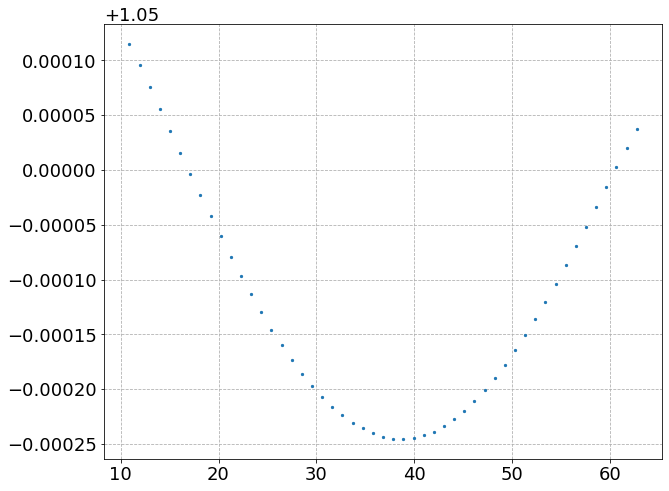

In [1383]:
fig, ax = plt.subplots()
ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], s=5)

In [1384]:
#df2 = load_data(ddir+'2021-06-14 104019.txt')
##df2 = load_data(ddir+'2021-06-15 073806.txt')
df2 = load_data(ddir+'2021-06-15 073806.txt')
df3 = load_data(ddir+'2021-06-16 074548.txt')
df_slow2 = load_data(ddir+'2021-06-15 073803slow.txt')
df_slow3 = load_data(ddir+'2021-06-16 074544slow.txt')

In [1410]:
#df2_ = df2.query('223 <= `Magnet Current [V]` <= 225')
#df2_ = df2.query('192 <= `Magnet Current [V]` <= 194')
df3_ = df3.query('192 <= `Magnet Current [V]` <= 194')
df2_ = df3_.loc['2021-06-16 09:00':]
df3_ = df3_.loc[:'2021-06-16 09:00']
# df3_ = df3_.loc['2021-06-16 09:00':]

In [1387]:
df3_

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-16 07:45:49,6/16/2021 7:45:49 AM,192.053420,24.344133,1.050077,0.0,0.0,0.0,0.0,422190.0,164917.96875,416169.0,162566.015625,1649035.0,644154.296875,0.0,0.000000,0.000000,10.900000,124.6,124.5
2021-06-16 07:47:13,6/16/2021 7:47:13 AM,192.053420,24.344017,1.050068,0.0,422190.0,416169.0,1649035.0,422190.0,164917.96875,416169.0,162566.015625,1649035.0,644154.296875,84.0,0.023333,0.000972,10.900000,124.6,124.5
2021-06-16 07:47:34,6/16/2021 7:47:34 AM,192.053363,24.343950,1.050049,0.0,424842.0,416169.0,1649035.0,424842.0,165953.90625,416169.0,162566.015625,1649035.0,644154.296875,105.0,0.029167,0.001215,11.935937,124.6,124.5
2021-06-16 07:47:55,6/16/2021 7:47:55 AM,192.053307,24.343850,1.050030,0.0,427494.0,416169.0,1649035.0,427494.0,166989.84375,416169.0,162566.015625,1649035.0,644154.296875,126.0,0.035000,0.001458,12.971875,124.6,124.5
2021-06-16 07:48:16,6/16/2021 7:48:16 AM,192.053420,24.343817,1.050012,0.0,430146.0,416169.0,1649035.0,430146.0,168025.78125,416169.0,162566.015625,1649035.0,644154.296875,147.0,0.040833,0.001701,14.007812,124.6,124.5
2021-06-16 07:48:37,6/16/2021 7:48:37 AM,192.053420,24.343783,1.049993,0.0,432798.0,416169.0,1649035.0,432798.0,169061.71875,416169.0,162566.015625,1649035.0,644154.296875,168.0,0.046667,0.001944,15.043750,124.6,124.5
2021-06-16 07:48:58,6/16/2021 7:48:58 AM,192.053363,24.343667,1.049974,0.0,435450.0,416169.0,1649035.0,435450.0,170097.65625,416169.0,162566.015625,1649035.0,644154.296875,189.0,0.052500,0.002188,16.079687,124.6,124.5
2021-06-16 07:49:20,6/16/2021 7:49:20 AM,192.053137,24.343600,1.049956,0.0,438102.0,416169.0,1649035.0,438102.0,171133.59375,416169.0,162566.015625,1649035.0,644154.296875,211.0,0.058611,0.002442,17.115625,124.6,124.5
2021-06-16 07:49:41,6/16/2021 7:49:41 AM,192.053363,24.343533,1.049938,0.0,440754.0,416169.0,1649035.0,440754.0,172169.53125,416169.0,162566.015625,1649035.0,644154.296875,232.0,0.064444,0.002685,18.151563,124.6,124.5


In [1388]:
df2_

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-15 14:29:28,6/15/2021 2:29:28 PM,192.053080,24.342450,1.050094,0.0,424842.0,416169.0,1649035.0,424842.0,165953.90625,416169.0,162566.015625,1649035.0,644154.296875,24681.0,6.855833,0.285660,11.935937,124.6,124.5
2021-06-15 14:29:49,6/15/2021 2:29:49 PM,192.053023,24.342700,1.050075,0.0,427494.0,416169.0,1649035.0,427494.0,166989.84375,416169.0,162566.015625,1649035.0,644154.296875,24702.0,6.861667,0.285903,12.971875,124.6,124.5
2021-06-15 14:30:10,6/15/2021 2:30:10 PM,192.053080,24.342950,1.050056,0.0,430146.0,416169.0,1649035.0,430146.0,168025.78125,416169.0,162566.015625,1649035.0,644154.296875,24723.0,6.867500,0.286146,14.007812,124.6,124.5
2021-06-15 14:30:31,6/15/2021 2:30:31 PM,192.053080,24.343233,1.050037,0.0,432798.0,416169.0,1649035.0,432798.0,169061.71875,416169.0,162566.015625,1649035.0,644154.296875,24744.0,6.873333,0.286389,15.043750,124.6,124.5
2021-06-15 14:30:52,6/15/2021 2:30:52 PM,192.053137,24.343533,1.050019,0.0,435450.0,416169.0,1649035.0,435450.0,170097.65625,416169.0,162566.015625,1649035.0,644154.296875,24765.0,6.879167,0.286632,16.079687,124.6,124.5
2021-06-15 14:31:13,6/15/2021 2:31:13 PM,192.053080,24.343733,1.050000,0.0,438102.0,416169.0,1649035.0,438102.0,171133.59375,416169.0,162566.015625,1649035.0,644154.296875,24786.0,6.885000,0.286875,17.115625,124.6,124.5
2021-06-15 14:31:34,6/15/2021 2:31:34 PM,192.053080,24.344083,1.049982,0.0,440754.0,416169.0,1649035.0,440754.0,172169.53125,416169.0,162566.015625,1649035.0,644154.296875,24807.0,6.890833,0.287118,18.151563,124.6,124.5
2021-06-15 14:31:55,6/15/2021 2:31:55 PM,192.053080,24.344300,1.049965,0.0,443406.0,416169.0,1649035.0,443406.0,173205.46875,416169.0,162566.015625,1649035.0,644154.296875,24828.0,6.896667,0.287361,19.187500,124.6,124.5
2021-06-15 14:32:16,6/15/2021 2:32:16 PM,192.053080,24.344617,1.049948,0.0,446058.0,416169.0,1649035.0,446058.0,174241.40625,416169.0,162566.015625,1649035.0,644154.296875,24849.0,6.902500,0.287604,20.223438,124.6,124.5


In [1389]:
37.5 + 20., 37.5 - 20.

(57.5, 17.5)

In [1390]:
37.8 + 20., 37.8 - 20.

(57.8, 17.799999999999997)

In [1391]:
y0 = df2_.magnet_Y_mm.iloc[1]
z0 = df2_.magnet_Z_mm.iloc[1]

In [1392]:
y0, z0

(124.6, 124.5)

In [1393]:
df.index[-1]-df.index[0]

Timedelta('1 days 04:48:08')

In [1394]:
df_line["NMR [T]"].mean()

1.0498791918431374

In [1395]:
mid = df_line["NMR [T]"].mean()

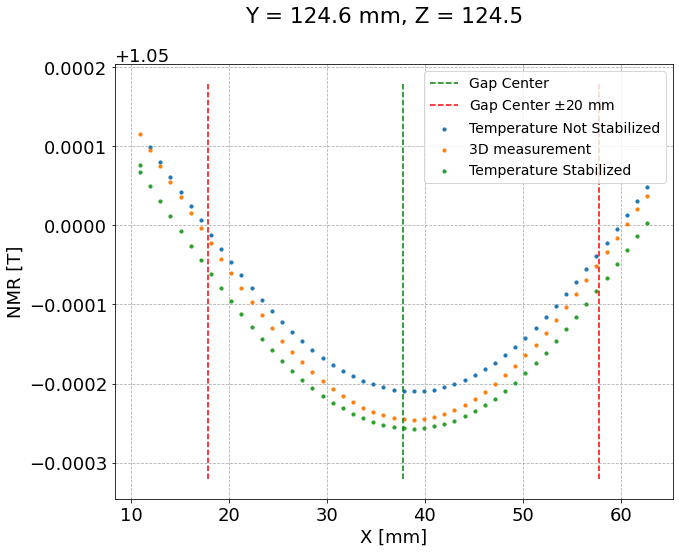

In [1411]:
fig, ax = plt.subplots()
ax.scatter(df2_['magnet_X_mm'], df2_['NMR [T]'], s=10, label='Temperature Not Stabilized')
ax.scatter(df_line['magnet_X_mm'], df_line['NMR [T]'], s=10, label='3D measurement')
ax.scatter(df3_['magnet_X_mm'], df3_['NMR [T]'], s=10, label='Temperature Stabilized')
#ax.plot([37.8, 37.8], [1.16-4e-4, 1.16+4.5e-4], 'g--', label='Gap Center')
#ax.plot([17.8, 17.8], [1.16-4e-4, 1.16+4.5e-4], 'r--', label=r'Gap Center $\pm 20$ mm')
#ax.plot([57.8, 57.8], [1.16-4e-4, 1.16+4.5e-4], 'r--')
pm = 2e-4
ax.plot([37.8, 37.8], [mid-pm, mid+pm*1.5], 'g--', label='Gap Center')
ax.plot([17.8, 17.8], [mid-pm, mid+pm*1.5], 'r--', label=r'Gap Center $\pm 20$ mm')
ax.plot([57.8, 57.8], [mid-pm, mid+pm*1.5], 'r--')

ax.set_xlabel('X [mm]')
ax.set_ylabel('NMR [T]')
fig.suptitle(f'Y = {y0} mm, Z = {z0}')
ax.legend(fontsize=14, loc='best');
# fig.savefig(plotdir+'pole_to_pole_comparison.pdf', facecolor='white', transparent=False)
# fig.savefig(plotdir+'pole_to_pole_comparison.png', facecolor='white', transparent=False)
fig.savefig('pole_to_pole_comparison.pdf', facecolor='white', transparent=False)
fig.savefig('pole_to_pole_comparison.png', facecolor='white', transparent=False)

In [1422]:
df2_.index[-1], df_line.index[0]

(Timestamp('2021-06-16 11:28:54'), Timestamp('2021-06-16 11:59:43'))

In [1397]:
df_line.index[0]

Timestamp('2021-06-16 11:59:43')

In [1398]:
df_3d.loc[df_line.index[0]]['NMR [T]']

1.050115291

In [1399]:
def find_neighbours_index(value, df):
#     exactmatch = df[df.index == value]
#     if not exactmatch.empty:
#         return exactmatch.index
#     else:
    lowerneighbour_ind = df[df.index < value].index[-1]#.idxmax()
    upperneighbour_ind = df[df.index > value].index[0]#.idxmin()
    return [lowerneighbour_ind, upperneighbour_ind] 

def interp_val(time, df, interp_col):
    xi, xf = find_neighbours_index(time, df)
    yi, yf = [df.loc[x_][interp_col] for x_ in [xi, xf]]
    return yi + (time-xi) / (xf-xi) * (yf-yi)

In [1400]:
xi, xf = find_neighbours_index(df_line.index[0], df_slow)
xi, xf

(Timestamp('2021-06-16 11:53:55'), Timestamp('2021-06-16 12:03:55'))

In [1401]:
interp_val(df_line.index[0], df_slow, 'Yoke (center magnet)')

23.749517482

In [1402]:
df_slow.loc[xi]['Yoke (center magnet)'], df_slow.loc[xf]['Yoke (center magnet)']

(23.746233, 23.7518959)

In [1403]:
[(i-df_line.index[0]).total_seconds()/60. for i in find_neighbours_index(df_line.index[0], df_slow)]

[-5.8, 4.2]

In [1404]:
df_line['Yoke (center magnet)'] = [interp_val(i, df_slow, 'Yoke (center magnet)') for i in df_line.index]
df2_['Yoke (center magnet)'] = [interp_val(i, df_slow2, 'Yoke (center magnet)') for i in df2_.index]
df3_['Yoke (center magnet)'] = [interp_val(i, df_slow3, 'Yoke (center magnet)') for i in df3_.index]

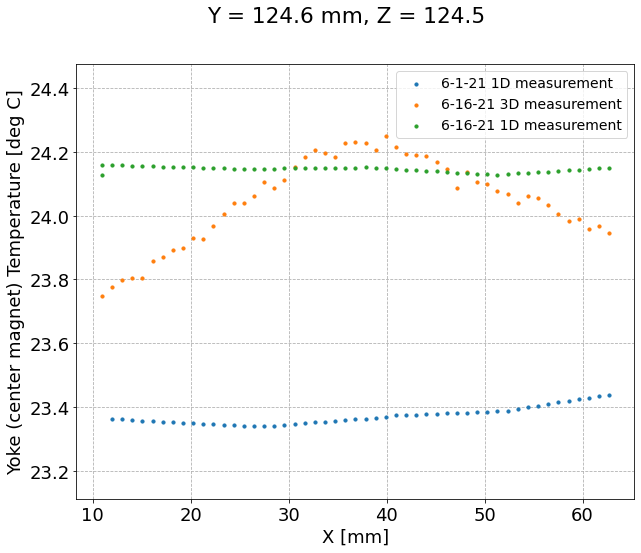

In [1405]:
fig, ax = plt.subplots()
ax.scatter(df2_['magnet_X_mm'], df2_['Yoke (center magnet)'], s=10, label='6-1-21 1D measurement')
ax.scatter(df_line['magnet_X_mm'], df_line['Yoke (center magnet)'], s=10, label='6-16-21 3D measurement')
ax.scatter(df3_['magnet_X_mm'], df3_['Yoke (center magnet)'], s=10, label='6-16-21 1D measurement')
# ax.plot([37.8, 37.8], [23, 24], 'g--', label='Gap Center')
# ax.plot([17.8, 17.8], [mid-4e-4, mid+4.5e-4], 'r--', label=r'Gap Center $\pm 20$ mm')
# ax.plot([57.8, 57.8], [mid-4e-4, mid+4.5e-4], 'r--')
all_temps = np.concatenate([_['Yoke (center magnet)'] for _ in [df_line, df2_, df3_]])
tma = np.max(all_temps)
tmi = np.min(all_temps)
tra = tma - tmi

ax.set_ylim([tmi-0.25*tra, tma+0.25*tra])

ax.set_xlabel('X [mm]')
ax.set_ylabel('Yoke (center magnet) Temperature [deg C]')
fig.suptitle(f'Y = {y0} mm, Z = {z0}')
ax.legend(fontsize=14, loc='best');
fig.savefig('pole_to_pole_temp_comparison.pdf', facecolor='white', transparent=False)
fig.savefig('pole_to_pole_temp_comparison.png', facecolor='white', transparent=False)

In [1408]:
B_on_T = -6e-5 # Tesla / deg
#B_corr = B_on_T * (df_line['Yoke (center magnet)']-df2_['Yoke (center magnet)'].iloc[-1])
B_corr = B_on_T * (df_line['Yoke (center magnet)']-df3_['Yoke (center magnet)'].iloc[-1])
df_line['NMR_corr'] = df_line['NMR [T]'] - B_corr

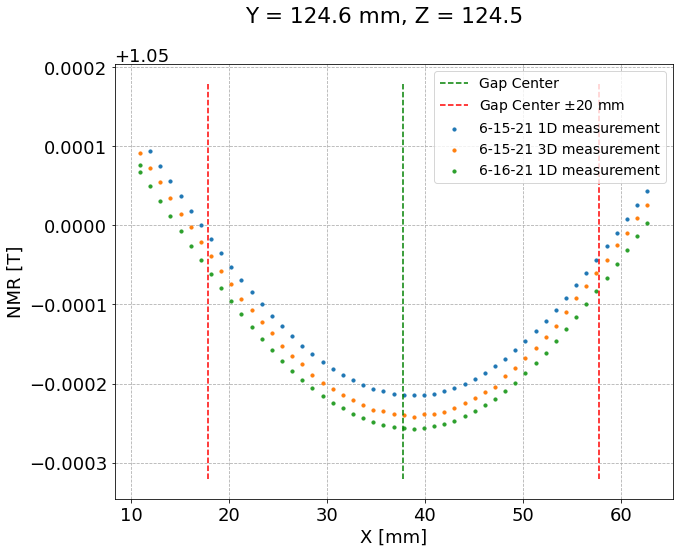

In [1409]:
fig, ax = plt.subplots()
ax.scatter(df2_['magnet_X_mm'], df2_['NMR [T]'], s=10, label='6-15-21 1D measurement')
ax.scatter(df_line['magnet_X_mm'], df_line['NMR_corr'], s=10, label='6-15-21 3D measurement')
ax.scatter(df3_['magnet_X_mm'], df3_['NMR [T]'], s=10, label='6-16-21 1D measurement')
#ax.plot([37.8, 37.8], [1.16-4e-4, 1.16+4.5e-4], 'g--', label='Gap Center')
#ax.plot([17.8, 17.8], [1.16-4e-4, 1.16+4.5e-4], 'r--', label=r'Gap Center $\pm 20$ mm')
#ax.plot([57.8, 57.8], [1.16-4e-4, 1.16+4.5e-4], 'r--')

pm = 2e-4
ax.plot([37.8, 37.8], [mid-pm, mid+pm*1.5], 'g--', label='Gap Center')
ax.plot([17.8, 17.8], [mid-pm, mid+pm*1.5], 'r--', label=r'Gap Center $\pm 20$ mm')
ax.plot([57.8, 57.8], [mid-pm, mid+pm*1.5], 'r--')


ax.set_xlabel('X [mm]')
ax.set_ylabel('NMR [T]')
fig.suptitle(f'Y = {y0} mm, Z = {z0}')
ax.legend(fontsize=14, loc='best');
fig.savefig('temp_corrected_pole_to_pole_comparison.pdf', facecolor='white', transparent=False)
fig.savefig('temp_corrected_pole_to_pole_comparison.png', facecolor='white', transparent=False)

In [1283]:
B_corr

Datetime
2021-06-15 14:59:37   -0.000002
2021-06-15 15:10:17   -0.000005
2021-06-15 15:20:56   -0.000008
2021-06-15 15:31:35   -0.000009
2021-06-15 15:42:15   -0.000011
2021-06-15 15:52:58   -0.000015
2021-06-15 16:04:10   -0.000013
2021-06-15 16:14:51   -0.000017
2021-06-15 16:25:31   -0.000020
2021-06-15 16:36:11   -0.000020
2021-06-15 16:46:50   -0.000021
2021-06-15 16:57:30   -0.000024
2021-06-15 17:08:13   -0.000022
2021-06-15 17:19:24   -0.000024
2021-06-15 17:30:04   -0.000026
2021-06-15 17:40:44   -0.000029
2021-06-15 17:51:23   -0.000029
2021-06-15 18:02:04   -0.000031
2021-06-15 18:12:43   -0.000031
2021-06-15 18:23:22   -0.000033
2021-06-15 18:34:36   -0.000034
2021-06-15 18:45:22   -0.000035
2021-06-15 18:56:03   -0.000033
2021-06-15 19:06:39   -0.000035
2021-06-15 19:17:19   -0.000038
2021-06-15 19:27:59   -0.000037
2021-06-15 19:39:10   -0.000037
2021-06-15 19:49:50   -0.000039
2021-06-15 20:00:30   -0.000040
2021-06-15 20:11:08   -0.000041
2021-06-15 20:21:46   -0.000043

In [823]:
yc = df_slow['Yoke (center magnet)']
yc.max() - yc.min()

0.48492239999999853

In [828]:
(yc.max() - yc.min()) * 5e-5

2.424611999999993e-05

In [827]:
mc = df_3d['Magnet Current [V]']
mc.max() - mc.min()

0.0005666670000152862

In [829]:
(mc.max() - mc.min()) * 1e-3

5.666670000152862e-07

In [108]:
idx = df2_['NMR [T]'].argmin()

In [109]:
df2_.iloc[idx]

Time                    6/15/2021 7:48:47 AM
Magnet Current [V]                 224.06119
Magnet Voltage [V]                 29.201067
NMR [T]                             1.159672
NMR [FFT]                                0.0
Zaber_Pattern_X                     491142.0
Zaber_Pattern_Y                     416169.0
Zaber_Pattern_Z                    1649035.0
Zaber_Meas_Encoder_X                491142.0
Zaber_Meas_Micron_X             191852.34375
Zaber_Meas_Encoder_Y                416169.0
Zaber_Meas_Micron_Y            162566.015625
Zaber_Meas_Encoder_Z               1649035.0
Zaber_Meas_Micron_Z            644154.296875
seconds_delta                          640.0
hours_delta                         0.177778
days_delta                          0.007407
magnet_X_mm                        37.834375
magnet_Y_mm                            124.6
magnet_Z_mm                            124.5
Name: 2021-06-15 07:48:47, dtype: object

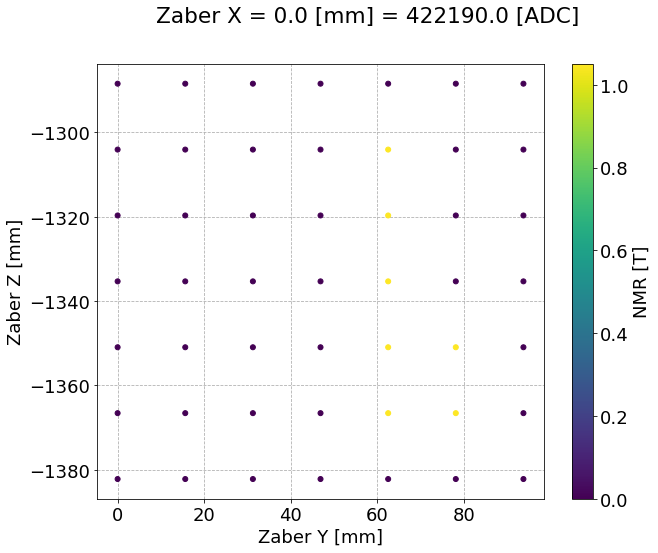

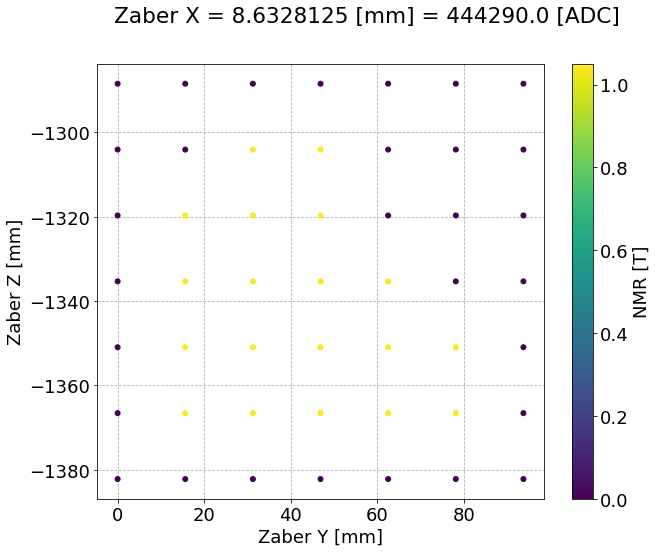

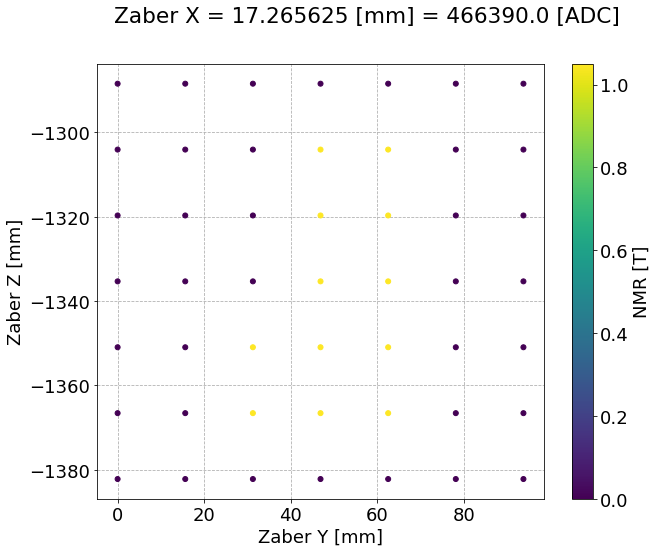

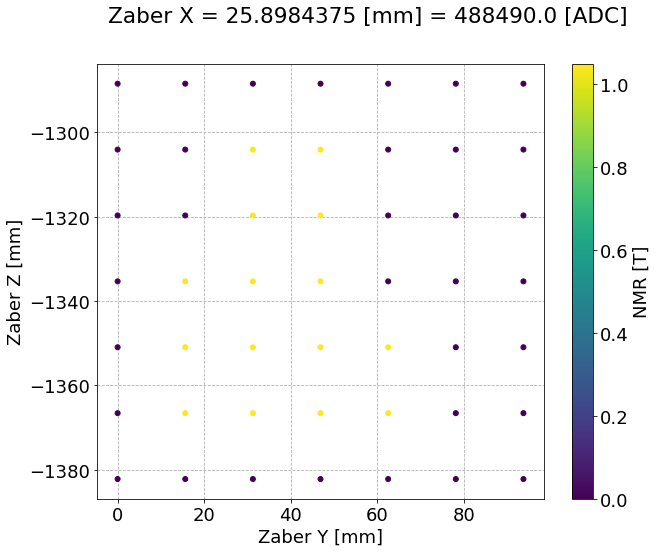

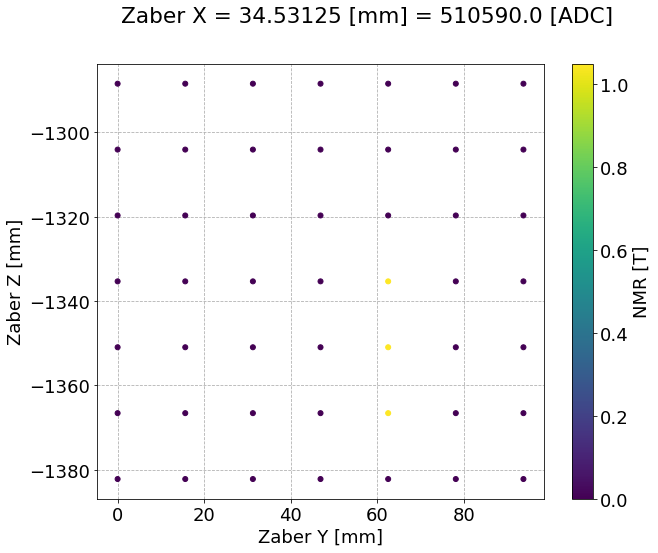

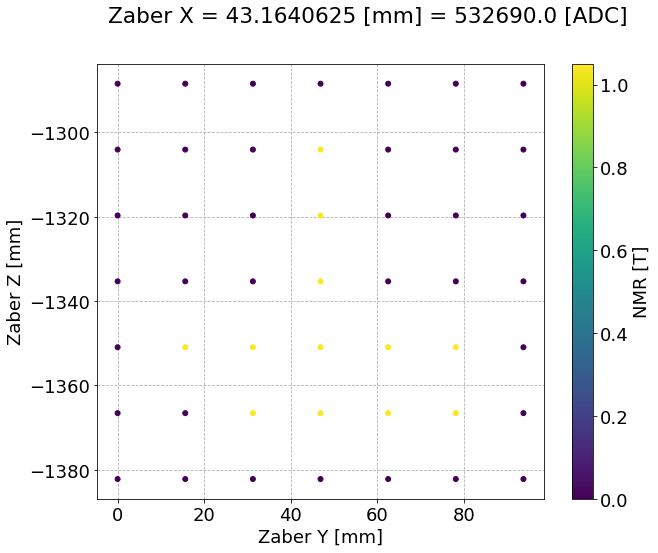

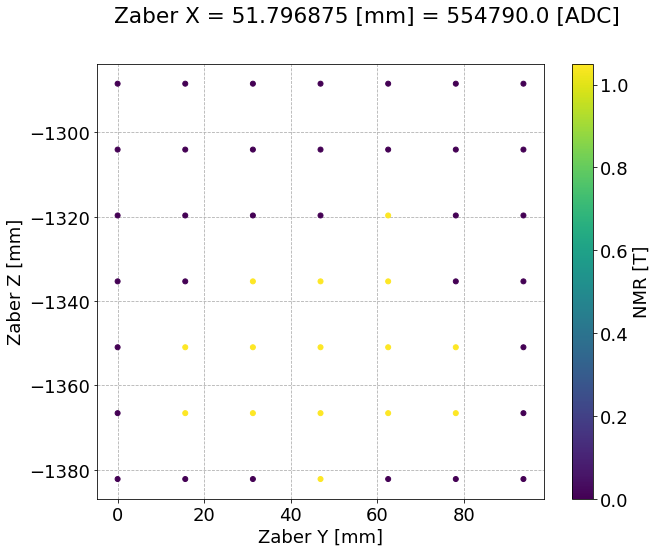

In [279]:
for xval in df['Zaber_Pattern_X'].unique():
    fig, ax = plot_xplane(df, xval, f'{plotdir_pattern}xslices/NMR_vs_Z_vs_Y_{int(xval):d}')

# 1D Data, side by side

In [13]:
# add run number

In [31]:
def find_runs(dfs, curr_unit='A'):
    for df in dfs:
        cs = np.unique(df[f"Magnet Current [{curr_unit}]"].round(1))
        print(f'{df.index[0]}: {cs}')

In [32]:
np.unique(df_slow_6_14['Magnet Current [A]'].round(1))

array([192.1])

In [33]:
dfs_slow = [df_slow_6_14, df_slow_6_15, df_slow_6_16]
dfs = [df_6_14, df_6_15, df_6_16]

In [34]:
find_runs(dfs_slow)

2021-06-16 11:41:47: [192.1]
2021-06-15 07:38:03: [-43.3  -0.  128.  144.  160.  176.  192.1 223.6 224.1]
2021-06-16 07:45:44: [-1.281e+02 -5.580e+01 -3.100e+00 -0.000e+00  2.000e-01  1.300e+00
  8.010e+01  1.906e+02  1.921e+02  2.081e+02]


In [26]:
dfs_slow[0]

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-06-16 11:41:47,6/16/2021 11:41:47 AM,192.053363,24.303133,43.369446,43.230633,30.016134,31.591787,30.525621,36.119183,25.983578,...,152566.015625,390569.0,634154.296875,1623435.0,0.0,0.000000,0.000000,-89.596887,21.630084,520.937775
2021-06-16 11:42:27,6/16/2021 11:42:27 AM,192.053420,24.302800,43.348938,43.227825,29.964848,31.535353,30.735952,36.096176,25.983381,...,152566.015625,390569.0,634154.296875,1623435.0,40.0,0.011111,0.000463,-89.596887,21.630084,520.937775
2021-06-16 11:42:59,6/16/2021 11:42:59 AM,192.053533,24.302650,43.326576,43.219639,30.004061,31.566269,30.600853,36.080647,25.981827,...,152566.015625,390569.0,634154.296875,1623435.0,72.0,0.020000,0.000833,-89.596887,21.630084,520.937775
2021-06-16 11:53:55,6/16/2021 11:53:55 AM,192.053477,24.302117,43.343601,43.205379,30.036440,31.587826,30.528242,36.097576,25.999256,...,158566.015625,405929.0,646154.296875,1654155.0,728.0,0.202222,0.008426,-89.596887,23.973834,516.250275
2021-06-16 12:03:55,6/16/2021 12:03:55 PM,192.053420,24.302733,43.388645,43.224640,30.025135,31.597403,30.630676,36.153221,26.001696,...,164566.015625,421289.0,652154.296875,1669515.0,1328.0,0.368889,0.015370,-89.596887,26.317584,513.906525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-18 09:23:47,6/18/2021 9:23:47 AM,192.053760,24.351700,43.839043,43.705174,30.580523,32.121181,31.050869,36.682983,26.554451,...,152566.015625,390569.0,634154.296875,1623435.0,164520.0,45.700000,1.904167,-89.596887,21.630084,520.937775
2021-06-18 09:33:47,6/18/2021 9:33:47 AM,192.054043,24.350317,43.845173,43.680374,30.564232,32.077824,30.943970,36.653240,26.534205,...,152566.015625,390569.0,634154.296875,1623435.0,165120.0,45.866667,1.911111,-89.596887,21.630084,520.937775
2021-06-18 09:43:47,6/18/2021 9:43:47 AM,192.053817,24.347917,43.847843,43.697243,30.497158,32.023609,30.936424,36.612392,26.543333,...,152566.015625,390569.0,634154.296875,1623435.0,165720.0,46.033333,1.918056,-89.596887,21.630084,520.937775


In [22]:
dfs

[                                      Time  Magnet Current [V]  \
 Datetime                                                         
 2021-06-16 11:41:51  6/16/2021 11:41:51 AM          192.053363   
 2021-06-16 11:43:46  6/16/2021 11:43:46 AM          192.053477   
 2021-06-16 11:44:01  6/16/2021 11:44:01 AM          192.053420   
 2021-06-16 11:44:15  6/16/2021 11:44:15 AM          192.053420   
 2021-06-16 11:44:30  6/16/2021 11:44:30 AM          192.053477   
 ...                                    ...                 ...   
 2021-06-17 16:28:57   6/17/2021 4:28:57 PM          192.053760   
 2021-06-17 16:29:13   6/17/2021 4:29:13 PM          192.053703   
 2021-06-17 16:29:28   6/17/2021 4:29:28 PM          192.053760   
 2021-06-17 16:29:43   6/17/2021 4:29:43 PM          192.053703   
 2021-06-17 16:29:59   6/17/2021 4:29:59 PM          192.053817   
 
                      Magnet Voltage [V]   NMR [T]  NMR [FFT]  Zaber_Pattern_X  \
 Datetime                                    

In [10]:
# Load, Combine, Transform

In [11]:
df_6_14 = load_data(ddir+patternfile)
df_slow_6_14 = load_data(ddir+slowfile)
df_6_15 = load_data(ddir+patternfile_6_15)
df_slow_6_15 = load_data(ddir+slowfile_6_15)
df_6_16 = load_data(ddir+patternfile_6_16)
df_slow_6_16 = load_data(ddir+slowfile_6_16)

In [12]:
df_6_15

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-15 07:38:07,6/15/2021 7:38:07 AM,224.061133,29.205083,1.160179,0.0,0.0,0.0,0.0,422190.0,164917.96875,403369.0,157566.015625,1636235.0,639154.296875,0.0,0.000000,0.000000,10.900000,119.6,129.5
2021-06-15 07:39:14,6/15/2021 7:39:14 AM,224.061360,29.204067,1.160174,0.0,422190.0,416169.0,1649035.0,422190.0,164917.96875,416169.0,162566.015625,1649035.0,644154.296875,67.0,0.018611,0.000775,10.900000,124.6,124.5
2021-06-15 07:39:35,6/15/2021 7:39:35 AM,224.061247,29.203917,1.160143,0.0,424842.0,416169.0,1649035.0,424842.0,165953.90625,416169.0,162566.015625,1649035.0,644154.296875,88.0,0.024444,0.001019,11.935937,124.6,124.5
2021-06-15 07:39:56,6/15/2021 7:39:56 AM,224.061303,29.203850,1.160112,0.0,427494.0,416169.0,1649035.0,427494.0,166989.84375,416169.0,162566.015625,1649035.0,644154.296875,109.0,0.030278,0.001262,12.971875,124.6,124.5
2021-06-15 07:40:17,6/15/2021 7:40:17 AM,224.061360,29.203833,1.160081,0.0,430146.0,416169.0,1649035.0,430146.0,168025.78125,416169.0,162566.015625,1649035.0,644154.296875,130.0,0.036111,0.001505,14.007812,124.6,124.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-15 14:46:48,6/15/2021 2:46:48 PM,192.053080,24.356000,1.049973,0.0,544182.0,416169.0,1649035.0,544182.0,212571.09375,416169.0,162566.015625,1649035.0,644154.296875,25721.0,7.144722,0.297697,58.553125,124.6,124.5
2021-06-15 14:47:09,6/15/2021 2:47:09 PM,192.053080,24.356267,1.049991,0.0,546834.0,416169.0,1649035.0,546834.0,213607.03125,416169.0,162566.015625,1649035.0,644154.296875,25742.0,7.150556,0.297940,59.589063,124.6,124.5
2021-06-15 14:47:30,6/15/2021 2:47:30 PM,192.053137,24.356533,1.050008,0.0,549486.0,416169.0,1649035.0,549486.0,214642.96875,416169.0,162566.015625,1649035.0,644154.296875,25763.0,7.156389,0.298183,60.625000,124.6,124.5


In [910]:
df_6_16

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-16 07:45:49,6/16/2021 7:45:49 AM,192.053420,24.344133,1.050077,0.0,0.0,0.0,0.0,422190.0,164917.96875,416169.0,162566.015625,1649035.0,644154.296875,0.0,0.000000,0.000000,10.900000,124.6,124.5
2021-06-16 07:47:13,6/16/2021 7:47:13 AM,192.053420,24.344017,1.050068,0.0,422190.0,416169.0,1649035.0,422190.0,164917.96875,416169.0,162566.015625,1649035.0,644154.296875,84.0,0.023333,0.000972,10.900000,124.6,124.5
2021-06-16 07:47:34,6/16/2021 7:47:34 AM,192.053363,24.343950,1.050049,0.0,424842.0,416169.0,1649035.0,424842.0,165953.90625,416169.0,162566.015625,1649035.0,644154.296875,105.0,0.029167,0.001215,11.935937,124.6,124.5
2021-06-16 07:47:55,6/16/2021 7:47:55 AM,192.053307,24.343850,1.050030,0.0,427494.0,416169.0,1649035.0,427494.0,166989.84375,416169.0,162566.015625,1649035.0,644154.296875,126.0,0.035000,0.001458,12.971875,124.6,124.5
2021-06-16 07:48:16,6/16/2021 7:48:16 AM,192.053420,24.343817,1.050012,0.0,430146.0,416169.0,1649035.0,430146.0,168025.78125,416169.0,162566.015625,1649035.0,644154.296875,147.0,0.040833,0.001701,14.007812,124.6,124.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-16 11:27:30,6/16/2021 11:27:30 AM,192.053420,24.305517,1.049978,0.0,544182.0,416169.0,1649035.0,544182.0,212571.09375,416169.0,162566.015625,1649035.0,644154.296875,13301.0,3.694722,0.153947,58.553125,124.6,124.5
2021-06-16 11:27:51,6/16/2021 11:27:51 AM,192.053477,24.305533,1.049995,0.0,546834.0,416169.0,1649035.0,546834.0,213607.03125,416169.0,162566.015625,1649035.0,644154.296875,13322.0,3.700556,0.154190,59.589063,124.6,124.5
2021-06-16 11:28:12,6/16/2021 11:28:12 AM,192.053590,24.305533,1.050013,0.0,549486.0,416169.0,1649035.0,549486.0,214642.96875,416169.0,162566.015625,1649035.0,644154.296875,13343.0,3.706389,0.154433,60.625000,124.6,124.5


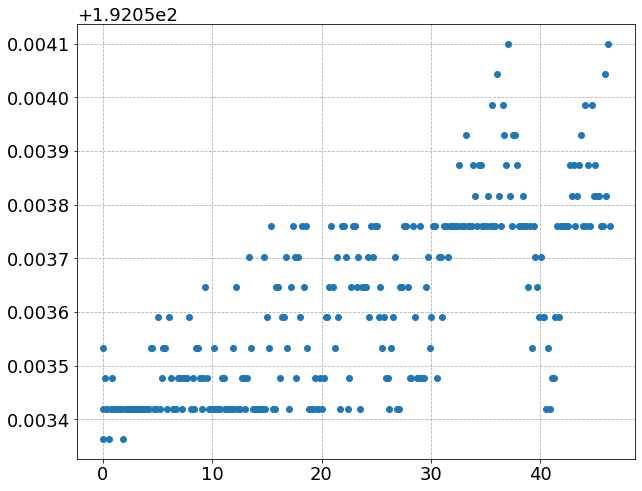

In [84]:
fig, ax = plt.subplots()
ax.scatter(df_slow_6_14.hours_delta, df_slow_6_14['Magnet Current [A]'])

In [39]:
# currents_6_14 = [224.]
# currents_6_15 = np.array([224., 128., 144., 160., 176.])
##currents_6_15 = np.array([128., 144., 160., 176., 224.])
currents_6_15 = np.array([128., 144., 160., 176., 192., 224.])
# currents_6_15 = np.array([224., 128., 144., 160., 176., 192.])
currents_6_16 = np.array([192., 208.])

# concat
currents = np.unique(np.concatenate([currents_6_15, currents_6_16]))

In [40]:
currents

array([128., 144., 160., 176., 192., 208., 224.])

In [247]:
# from center
x_cen = 37.83
# x_cen = 38.87
# x_cen = 39.91
# HP location
x_HP = 34.7

dI = 3.
B_fracs = []
B_ratios = []
B_vals = []
x_mms = []
dates = []
#for I in currents_6_15:
for I in currents:
    if I in currents_6_15:
        df_ = df_6_15.query(f'{I-dI} < `Magnet Current [V]` < {I+dI}').copy() # fix label [V] to [A]
        dates.append('6-15')
    else:
        df_ = df_6_16.query(f'{I-dI} < `Magnet Current [V]` < {I+dI}').copy() # fix label [V] to [A]
        dates.append('6-16')
    nmr_m = df_['NMR [T]'].mean()
    dnmr = 5e-3
    df_ = df_.query(f'abs(`NMR [T]`-{nmr_m}) > - {dnmr}').copy()
    # extrapolate to x=3 mm (NMR taped on pole for old measurement)
    interp_func = interp1d(df_['magnet_X_mm'].values[1:], df_['NMR [T]'].values[1:], kind='linear', fill_value='extrapolate')
    # query for symmetry
#     df_ = df_.query(f'magnet_X_mm >= 12.').copy()
    B0 = interp_func(3.)
    i_cen = np.argwhere(np.isclose(df_['magnet_X_mm'], x_cen, atol=1e-3, rtol=1e-3))[0][0]
    i_HP = np.argwhere(np.isclose(df_['magnet_X_mm'], x_HP, atol=1e-3, rtol=1e-3))[0][0]
    B_frac_ = (df_['NMR [T]'] / df_.iloc[i_cen]['NMR [T]']).values
    #B_ratio_ = (df_.iloc[i_cen]['NMR [T]'] / df_['NMR [T]'].iloc[0])
    B_ratio_ = (df_.iloc[i_HP]['NMR [T]'] / B0)
    ###B_frac_ = ((df_['NMR [T]'] - df_.iloc[i_cen]['NMR [T]'])/ df_.iloc[i_cen]['NMR [T]']).values
#     B_frac_ = (df_['NMR [T]'] / df_.iloc[0]['NMR [T]']).values
#     B_frac = (df_['NMR [T]'] / df_[df_.index == '2021-06-16 10:01:02']['NMR [T]'])
    B_val_ = df_['NMR [T]']
    x_mm_ = df_['magnet_X_mm'].values
    B_fracs.append(B_frac_)
    B_ratios.append(B_ratio_)
    B_vals.append(B_val_)
    x_mms.append(x_mm_)

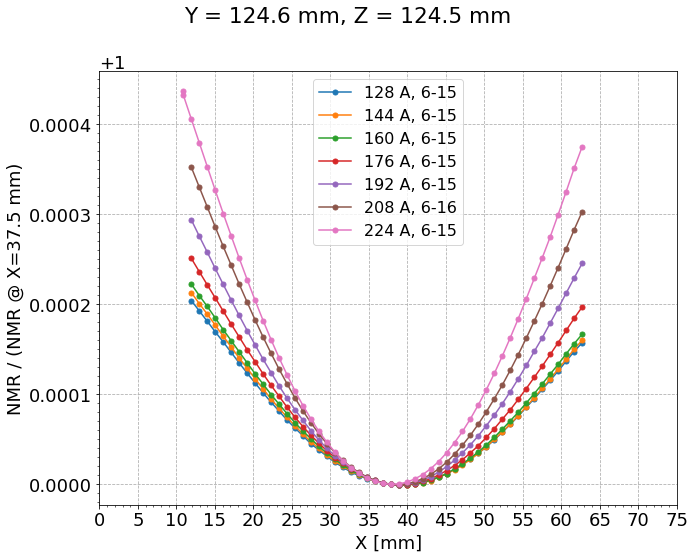

In [248]:
fig, ax = plt.subplots()
fig.patch.set_facecolor('white')
for index, _ in enumerate(zip(currents, B_fracs, x_mms, dates)):
    I, B, x, date = _
    #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
    #ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, {date}')
    ax.plot(x, B, '.-', markersize=10, zorder=index+10, label=f'{int(I):d} A, {date}')
    
# for index, _ in enumerate(zip(currents_6_16, B_fracs2, x_mms2)):
#     I, B, x = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')
#     ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')

ax.xaxis.set_major_locator(MultipleLocator(5))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
ax.set_xlim([0, 75])
ax.set_xlabel('X [mm]')
#ax.set_ylabel('NMR / (NMR @ min(X))')
ax.set_ylabel('NMR / (NMR @ X=37.5 mm)')
#fig.suptitle(f'Y = {y0} mm, Z = {z0} - 1 ')
fig.suptitle(f'Y = {y0} mm, Z = {z0} mm')
ax.legend(fontsize=16, loc='best').set_zorder(100);
fig.tight_layout()
fig.savefig(plotdir+'pole_to_pole_all.png')
fig.savefig(plotdir+'pole_to_pole_all.pdf')

In [249]:
x-37.5

array([-26.6      , -26.6      , -25.5640625, -24.528125 , -23.4921875,
       -22.45625  , -21.4203125, -20.384375 , -19.3484375, -18.3125   ,
       -17.2765625, -16.240625 , -15.2046875, -14.16875  , -13.1328125,
       -12.096875 , -11.0609375, -10.025    ,  -8.9890625,  -7.953125 ,
        -6.9171875,  -5.88125  ,  -4.8453125,  -3.809375 ,  -2.7734375,
        -1.7375   ,  -0.7015625,   0.334375 ,   1.3703125,   2.40625  ,
         3.4421875,   4.478125 ,   5.5140625,   6.55     ,   7.5859375,
         8.621875 ,   9.6578125,  10.69375  ,  11.7296875,  12.765625 ,
        13.8015625,  14.8375   ,  15.8734375,  16.909375 ,  17.9453125,
        18.98125  ,  20.0171875,  21.053125 ,  22.0890625,  23.125    ,
        24.1609375,  25.196875 ])

In [250]:
# load old data
pkldir = ('/home/ckampa/data/hallprobecalib_extras/datafiles/magnet_ramp/'+
          '2021-02-24/')
pklinfo_hall_regress = pkldir+'ramp_2021-02-24.run-info_hall_regression.pkl'
pklinfo_nmr_regress = pkldir+'ramp_2021-02-24.run-info_nmr_regression.pkl'
# load from pickle
df_NMR = pd.read_pickle(pklinfo_nmr_regress)
df_Hall = pd.read_pickle(pklinfo_hall_regress)

'''
# load FEMM data for ratio plot
#femm_hall, femm_hall_meas = load_data(femmfile_75_Hall, Hall_currents)
#femm_nmr, femm_nmr_meas = load_data(femmfile_75_NMR, NMR_currents)
temp = load_data(femmfile_75_1006, Hall_currents)
femm_hall, femm_hall_meas, femm_nmr, femm_nmr_meas = temp
femm_nmr_meas = femm_nmr_meas.query('I > 120').copy()

I_min_NMR = femm_nmr_meas.query('I>120').I.min()
'''
0;#

In [251]:
df_NMR['B_NMR']

7     0.732467
8     0.821564
9     0.906698
10    0.981974
11    1.039757
12    1.044941
13    1.109522
14    1.151746
15    1.208615
16    1.248891
17    1.285747
18    1.302796
Name: B_NMR, dtype: float64

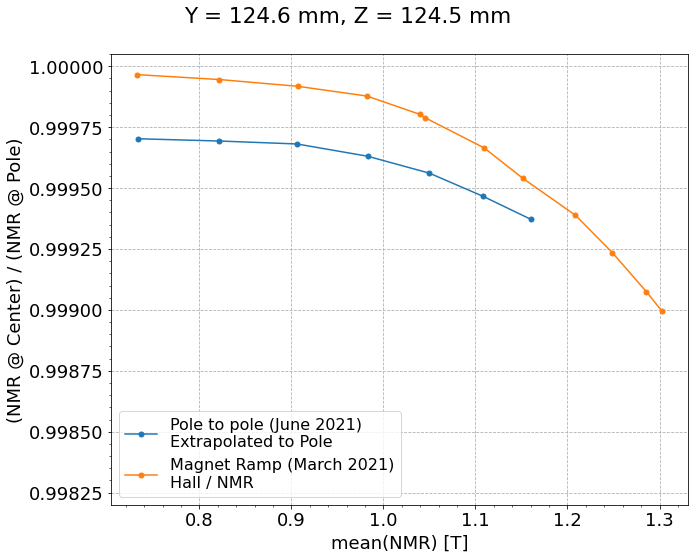

In [252]:
fig, ax = plt.subplots()
fig.patch.set_facecolor('white')
# for index, _ in enumerate(zip(currents, B_fracs, x_mms, dates)):
#     I, B, x, date = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
#     #ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, {date}')
#     ax.plot(x, B, '.-', markersize=10, zorder=index+10, label=f'{int(I):d} A, {date}')
B_mean = [np.mean(B) for B in B_vals]
ax.plot(B_mean, B_ratios, '.-', markersize=10, zorder=index+10, label=f'Pole to pole (June 2021)\nExtrapolated to Pole')
ax.plot(df_NMR['B_NMR'], df_NMR['B_ratio'], '.-', markersize=10, zorder=index+10, label=f'Magnet Ramp (March 2021)\nHall / NMR')

# for index, _ in enumerate(zip(currents_6_16, B_fracs2, x_mms2)):
#     I, B, x = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')
#     ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')

#ax.xaxis.set_major_locator(MultipleLocator(5))
#ax.xaxis.set_minor_locator(MultipleLocator(1))
#ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
#ax.set_xlim([0, 75])
#ax.set_xlabel('X [mm]')
# ax.set_xlabel('Magnet Current [A]')
ax.set_xlabel('mean(NMR) [T]')
#ax.set_ylabel('NMR / (NMR @ min(X))')
ax.set_ylabel('(NMR @ Center) / (NMR @ Pole)')
#fig.suptitle(f'Y = {y0} mm, Z = {z0} - 1 ')
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
fig.suptitle(f'Y = {y0} mm, Z = {z0} mm')
ax.set_ylim([0.9982, 1.00005])
ax.legend(fontsize=16, loc='best').set_zorder(100);
fig.tight_layout()
# 
fig.savefig(plotdir+'B_ratio_vs_B.png')
fig.savefig(plotdir+'B_ratio_vs_B.pdf')

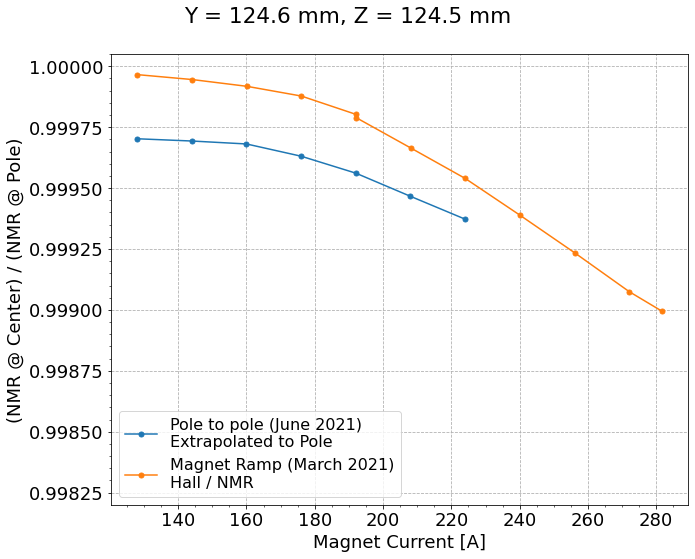

In [253]:
fig, ax = plt.subplots()
fig.patch.set_facecolor('white')
# for index, _ in enumerate(zip(currents, B_fracs, x_mms, dates)):
#     I, B, x, date = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
#     #ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, {date}')
#     ax.plot(x, B, '.-', markersize=10, zorder=index+10, label=f'{int(I):d} A, {date}')
ax.plot(currents, B_ratios, '.-', markersize=10, zorder=index+10, label=f'Pole to pole (June 2021)\nExtrapolated to Pole')
ax.plot(df_NMR['I'], df_NMR['B_ratio'], '.-', markersize=10, zorder=index+10, label=f'Magnet Ramp (March 2021)\nHall / NMR')

# for index, _ in enumerate(zip(currents_6_16, B_fracs2, x_mms2)):
#     I, B, x = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')
#     ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')

#ax.xaxis.set_major_locator(MultipleLocator(5))
#ax.xaxis.set_minor_locator(MultipleLocator(1))
#ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
#ax.set_xlim([0, 75])
#ax.set_xlabel('X [mm]')
ax.set_xlabel('Magnet Current [A]')
#ax.set_ylabel('NMR / (NMR @ min(X))')
ax.set_ylabel('(NMR @ Center) / (NMR @ Pole)')
#fig.suptitle(f'Y = {y0} mm, Z = {z0} - 1 ')
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
fig.suptitle(f'Y = {y0} mm, Z = {z0} mm')
ax.set_ylim([0.9982, 1.00005])
ax.legend(fontsize=16, loc='best').set_zorder(100);
fig.tight_layout()
# 
fig.savefig(plotdir+'B_ratio_comparison.png')
fig.savefig(plotdir+'B_ratio_comparison.pdf')

In [254]:
# do repeats

In [255]:
currents

array([128., 144., 160., 176., 192., 208., 224.])

In [256]:
currents_both = []
for I in currents:
    if (I in currents_6_15) and (I in currents_6_16):
        currents_both.append(I)

In [257]:
currents_both

[192.0]

In [262]:
df1 = df_6_15.query(f'{I-dI} < `Magnet Current [V]` < {I+dI}').copy()
df2 = df_6_16.query(f'({I-dI} < `Magnet Current [V]` < {I+dI}) & (hours_delta < 1.)').iloc[2:].copy()
df3 = df_6_16.query(f'({I-dI} < `Magnet Current [V]` < {I+dI}) & (hours_delta > 3.)').copy()

In [263]:
dfs = [df1, df2, df3]

In [264]:
# from center
x_cen = 37.83
# x_cen = 38.87
# x_cen = 39.91
# HP location
x_HP = 34.7

dI = 3.
B_fracs = []
B_ratios = []
B_vals = []
x_mms = []
dates = []
runs = []
#for I in currents_6_15:
# for I in currents:
I = currents_both[0]
#for i in ['6-15', '6-16']:
for i, df_ in enumerate(dfs):
    if df_.index[0].day == 15:
        dates.append('6-15')
    else:
        dates.append('6-16')
    runs.append(i)
    #df_ = df.query(f'{I-dI} < `Magnet Current [V]` < {I+dI}').copy() # fix label [V] to [A]
    nmr_m = df_['NMR [T]'].mean()
    dnmr = 5e-3
    df_ = df_.query(f'abs(`NMR [T]`-{nmr_m}) > - {dnmr}').copy()
    # extrapolate to x=3 mm (NMR taped on pole for old measurement)
    interp_func = interp1d(df_['magnet_X_mm'].values[1:], df_['NMR [T]'].values[1:], kind='linear', fill_value='extrapolate')
    # query for symmetry
#     df_ = df_.query(f'magnet_X_mm >= 12.').copy()
    B0 = interp_func(3.)
    i_cen = np.argwhere(np.isclose(df_['magnet_X_mm'], x_cen, atol=1e-3, rtol=1e-3))[0][0]
    i_HP = np.argwhere(np.isclose(df_['magnet_X_mm'], x_HP, atol=1e-3, rtol=1e-3))[0][0]
    B_frac_ = (df_['NMR [T]'] / df_.iloc[i_cen]['NMR [T]']).values
    #B_ratio_ = (df_.iloc[i_cen]['NMR [T]'] / df_['NMR [T]'].iloc[0])
    B_ratio_ = (df_.iloc[i_HP]['NMR [T]'] / B0)
    ###B_frac_ = ((df_['NMR [T]'] - df_.iloc[i_cen]['NMR [T]'])/ df_.iloc[i_cen]['NMR [T]']).values
#     B_frac_ = (df_['NMR [T]'] / df_.iloc[0]['NMR [T]']).values
#     B_frac = (df_['NMR [T]'] / df_[df_.index == '2021-06-16 10:01:02']['NMR [T]'])
    B_val_ = df_['NMR [T]']
    x_mm_ = df_['magnet_X_mm'].values
    B_fracs.append(B_frac_)
    B_ratios.append(B_ratio_)
    B_vals.append(B_val_)
    x_mms.append(x_mm_)

In [265]:
B_ratios

[0.9995614494146277, 0.9995634606428947, 0.9995589409011224]

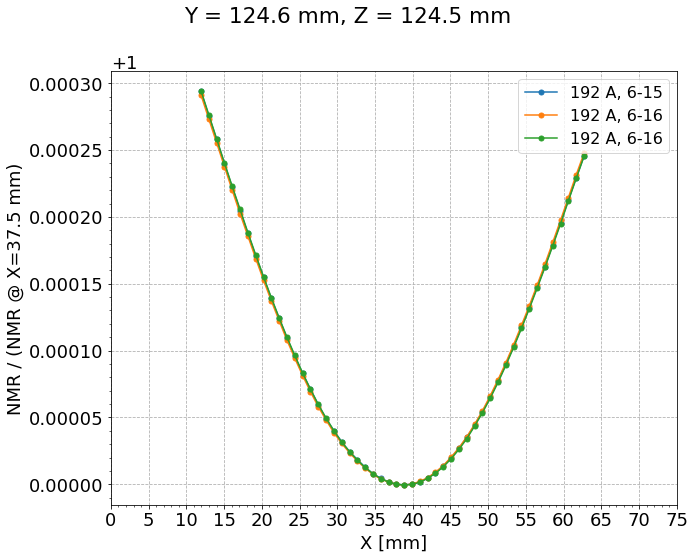

In [266]:
fig, ax = plt.subplots()
fig.patch.set_facecolor('white')
# for index, _ in enumerate(zip(currents, B_fracs, x_mms, dates)):
#     I, B, x, date = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
#     #ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, {date}')
#     ax.plot(x, B, '.-', markersize=10, zorder=index+10, label=f'{int(I):d} A, {date}')

ax.plot(x_mms[0], B_fracs[0], '.-', markersize=10, zorder=10, label=f'{int(currents_both[0]):d} A, {dates[0]}')
ax.plot(x_mms[1], B_fracs[1], '.-', markersize=10, zorder=10, label=f'{int(currents_both[0]):d} A, {dates[1]}')
ax.plot(x_mms[2], B_fracs[2], '.-', markersize=10, zorder=10, label=f'{int(currents_both[0]):d} A, {dates[1]}')
    
# for index, _ in enumerate(zip(currents_6_16, B_fracs2, x_mms2)):
#     I, B, x = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')
#     ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')

ax.xaxis.set_major_locator(MultipleLocator(5))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
ax.set_xlim([0, 75])
ax.set_xlabel('X [mm]')
#ax.set_ylabel('NMR / (NMR @ min(X))')
ax.set_ylabel('NMR / (NMR @ X=37.5 mm)')
#fig.suptitle(f'Y = {y0} mm, Z = {z0} - 1 ')
fig.suptitle(f'Y = {y0} mm, Z = {z0} mm')
ax.legend(fontsize=16, loc='best').set_zorder(100);
fig.tight_layout()
fig.savefig(plotdir+'pole_to_pole_repeat.png')
fig.savefig(plotdir+'pole_to_pole_repeat.pdf')

In [267]:
# NOTE CURRENT NOT CYCLED HERE

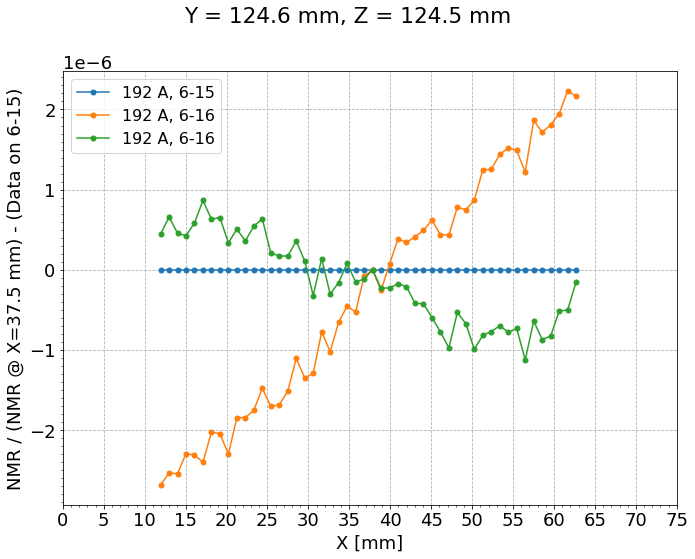

In [268]:
fig, ax = plt.subplots()
fig.patch.set_facecolor('white')
# for index, _ in enumerate(zip(currents, B_fracs, x_mms, dates)):
#     I, B, x, date = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
#     #ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, {date}')
#     ax.plot(x, B, '.-', markersize=10, zorder=index+10, label=f'{int(I):d} A, {date}')

ax.plot(x_mms[0], B_fracs[0]-B_fracs[0], '.-', markersize=10, zorder=10, label=f'{int(currents_both[0]):d} A, {dates[0]}')
ax.plot(x_mms[1], B_fracs[1]-B_fracs[0], '.-', markersize=10, zorder=10, label=f'{int(currents_both[0]):d} A, {dates[1]}')
ax.plot(x_mms[2], B_fracs[2]-B_fracs[0], '.-', markersize=10, zorder=10, label=f'{int(currents_both[0]):d} A, {dates[1]}')
    
# for index, _ in enumerate(zip(currents_6_16, B_fracs2, x_mms2)):
#     I, B, x = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')
#     ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')

ax.xaxis.set_major_locator(MultipleLocator(5))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1e-7))
ax.set_xlim([0, 75])
ax.set_xlabel('X [mm]')
#ax.set_ylabel('NMR / (NMR @ min(X))')
ax.set_ylabel('NMR / (NMR @ X=37.5 mm) - (Data on 6-15)')
#fig.suptitle(f'Y = {y0} mm, Z = {z0} - 1 ')
fig.suptitle(f'Y = {y0} mm, Z = {z0} mm')
ax.legend(fontsize=16, loc='best').set_zorder(100);
fig.tight_layout()
fig.savefig(plotdir+'pole_to_pole_repeat_compare.png')
fig.savefig(plotdir+'pole_to_pole_repeat_compare.pdf')

In [223]:
df1.index, df2.index, df3.index

(DatetimeIndex(['2021-06-15 14:29:28', '2021-06-15 14:29:49',
                '2021-06-15 14:30:10', '2021-06-15 14:30:31',
                '2021-06-15 14:30:52', '2021-06-15 14:31:13',
                '2021-06-15 14:31:34', '2021-06-15 14:31:55',
                '2021-06-15 14:32:16', '2021-06-15 14:32:37',
                '2021-06-15 14:32:57', '2021-06-15 14:33:18',
                '2021-06-15 14:33:39', '2021-06-15 14:34:00',
                '2021-06-15 14:34:21', '2021-06-15 14:35:13',
                '2021-06-15 14:35:34', '2021-06-15 14:35:55',
                '2021-06-15 14:36:16', '2021-06-15 14:36:37',
                '2021-06-15 14:36:58', '2021-06-15 14:37:19',
                '2021-06-15 14:37:40', '2021-06-15 14:38:02',
                '2021-06-15 14:38:23', '2021-06-15 14:38:44',
                '2021-06-15 14:39:05', '2021-06-15 14:39:26',
                '2021-06-15 14:40:19', '2021-06-15 14:40:40',
                '2021-06-15 14:41:01', '2021-06-15 14:41:22',
        

In [186]:
x

array([12.971875 , 14.0078125, 15.04375  , 16.0796875, 17.115625 ,
       18.1515625, 19.1875   , 20.2234375, 21.259375 , 22.2953125,
       23.33125  , 24.3671875, 25.403125 , 26.4390625, 27.475    ,
       28.5109375, 29.546875 , 30.5828125, 31.61875  , 32.6546875,
       33.690625 , 34.7265625, 35.7625   , 36.7984375, 37.834375 ,
       38.8703125, 39.90625  , 40.9421875, 41.978125 , 43.0140625,
       44.05     , 45.0859375, 46.121875 , 47.1578125, 48.19375  ,
       49.2296875, 50.265625 , 51.3015625, 52.3375   , 53.3734375,
       54.409375 , 55.4453125, 56.48125  , 57.5171875, 58.553125 ,
       59.5890625, 60.625    , 61.6609375, 62.696875 ])

In [ ]:
### OLD

In [51]:
37.5-10

27.5

In [52]:
65. - 37.5

27.5

In [56]:
x[-1] - 37.5

25.196875

In [57]:
37.5 - x[0]

26.6

In [58]:
x[0]

10.9

In [921]:
df_[df_.index == '2021-06-16 10:01:02']

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Zaber_Pattern_X,Zaber_Pattern_Y,Zaber_Pattern_Z,Zaber_Meas_Encoder_X,Zaber_Meas_Micron_X,Zaber_Meas_Encoder_Y,Zaber_Meas_Micron_Y,Zaber_Meas_Encoder_Z,Zaber_Meas_Micron_Z,seconds_delta,hours_delta,days_delta,magnet_X_mm,magnet_Y_mm,magnet_Z_mm
Datetime,,,,,,,,,,,,,,,,,,,,
2021-06-16 10:01:02,6/16/2021 10:01:02 AM,208.05739,26.595233,1.108116,0.0,491142.0,416169.0,1649035.0,491142.0,191852.34375,416169.0,162566.015625,1649035.0,644154.296875,8113.0,2.253611,0.0939,37.834375,124.6,124.5


In [926]:
# from end
dI = 3.
B_fracs = []
B_vals = []
x_mms = []
for I in currents_6_15:
    df_ = df_6_15.query(f'{I-dI} < `Magnet Current [V]` < {I+dI}').copy() # fix label [V] to [A]
    nmr_m = df_['NMR [T]'].mean()
    dnmr = 5e-3
    df_ = df_.query(f'abs(`NMR [T]`-{nmr_m}) > - {dnmr}').copy()
    B_frac_ = (df_['NMR [T]'] / df_.iloc[0]['NMR [T]']).values
#     B_frac = (df_['NMR [T]'] / df_[df_.index == '2021-06-16 10:01:02']['NMR [T]'])
    B_val_ = df_['NMR [T]']
    x_mm_ = df_['magnet_X_mm'].values
    B_fracs.append(B_frac_)
    B_vals.append(B_val_)
    x_mms.append(x_mm_)

In [1453]:
dI = 3.
B_fracs2 = []
B_vals2 = []
x_mms2 = []
for I in currents_6_16:
    df_ = df_6_16.query(f'{I-dI} < `Magnet Current [V]` < {I+dI}').copy() # fix label [V] to [A]
    nmr_m = df_['NMR [T]'].mean()
    dnmr = 5e-3
    df_ = df_.query(f'abs(`NMR [T]`-{nmr_m}) > - {dnmr}').copy()
    B_frac_ = (df_['NMR [T]'] / df_.iloc[0]['NMR [T]']).values
#     B_frac = (df_['NMR [T]'] / df_[df_.index == '2021-06-16 10:01:02']['NMR [T]'])
    B_val_ = df_['NMR [T]']
    x_mm_ = df_['magnet_X_mm'].values
    B_fracs2.append(B_frac_)
    B_vals2.append(B_val_)
    x_mms2.append(x_mm_)

In [1487]:
# from center
#x_cen = 37.83
# x_cen = 38.87
x_cen = 39.91
dI = 3.
B_fracs = []
B_vals = []
x_mms = []
for I in currents_6_15:
    df_ = df_6_15.query(f'{I-dI} < `Magnet Current [V]` < {I+dI}').copy() # fix label [V] to [A]
    nmr_m = df_['NMR [T]'].mean()
    dnmr = 5e-3
    df_ = df_.query(f'abs(`NMR [T]`-{nmr_m}) > - {dnmr}').copy()
    i_cen = np.argwhere(np.isclose(df_['magnet_X_mm'], x_cen, atol=1e-3, rtol=1e-3))[0][0]
    B_frac_ = (df_['NMR [T]'] / df_.iloc[i_cen]['NMR [T]']).values
    ###B_frac_ = ((df_['NMR [T]'] - df_.iloc[i_cen]['NMR [T]'])/ df_.iloc[i_cen]['NMR [T]']).values
#     B_frac_ = (df_['NMR [T]'] / df_.iloc[0]['NMR [T]']).values
#     B_frac = (df_['NMR [T]'] / df_[df_.index == '2021-06-16 10:01:02']['NMR [T]'])
    B_val_ = df_['NMR [T]']
    x_mm_ = df_['magnet_X_mm'].values
    B_fracs.append(B_frac_)
    B_vals.append(B_val_)
    x_mms.append(x_mm_)

In [1488]:
# from center
#x_cen = 37.83
dI = 3.
B_fracs2 = []
B_vals2 = []
x_mms2 = []
for I in currents_6_16:
    df_ = df_6_16.query(f'{I-dI} < `Magnet Current [V]` < {I+dI}').copy() # fix label [V] to [A]
    nmr_m = df_['NMR [T]'].mean()
    dnmr = 5e-3
    df_ = df_.query(f'abs(`NMR [T]`-{nmr_m}) > - {dnmr}').copy()
    i_cen = np.argwhere(np.isclose(df_['magnet_X_mm'], x_cen, atol=1e-3, rtol=1e-3))[0][0]
    B_frac_ = (df_['NMR [T]'] / df_.iloc[i_cen]['NMR [T]']).values
    ###B_frac_ = ((df_['NMR [T]'] - df_.iloc[i_cen]['NMR [T]'])/ df_.iloc[i_cen]['NMR [T]']).values
#     B_frac = (df_['NMR [T]'] / df_[df_.index == '2021-06-16 10:01:02']['NMR [T]'])
    B_val_ = df_['NMR [T]']
    x_mm_ = df_['magnet_X_mm'].values
    B_fracs2.append(B_frac_)
    B_vals2.append(B_val_)
    x_mms2.append(x_mm_)

In [1489]:
i_cen

27

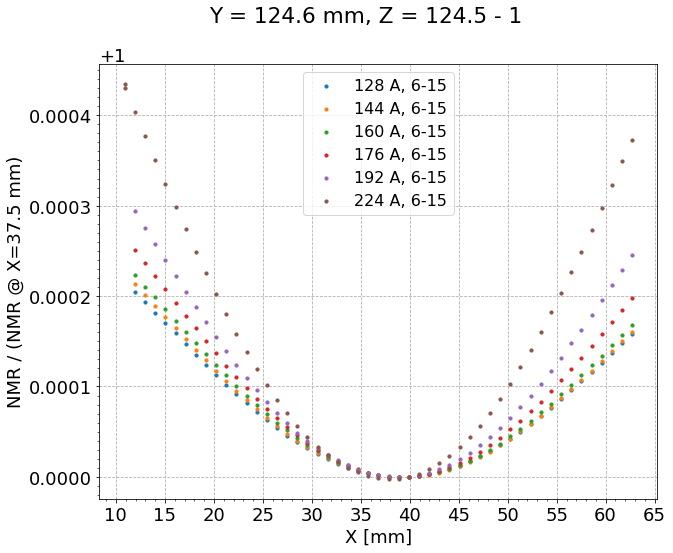

In [1491]:
fig, ax = plt.subplots()
for index, _ in enumerate(zip(currents_6_15, B_fracs, x_mms)):
    I, B, x = _
    #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
    ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
    
# for index, _ in enumerate(zip(currents_6_16, B_fracs2, x_mms2)):
#     I, B, x = _
#     #ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')
#     ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')

ax.xaxis.set_major_locator(MultipleLocator(5))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
ax.set_xlabel('X [mm]')
#ax.set_ylabel('NMR / (NMR @ min(X))')
ax.set_ylabel('NMR / (NMR @ X=37.5 mm)')
fig.suptitle(f'Y = {y0} mm, Z = {z0} - 1 ')
ax.legend(fontsize=16, loc='best').set_zorder(100);

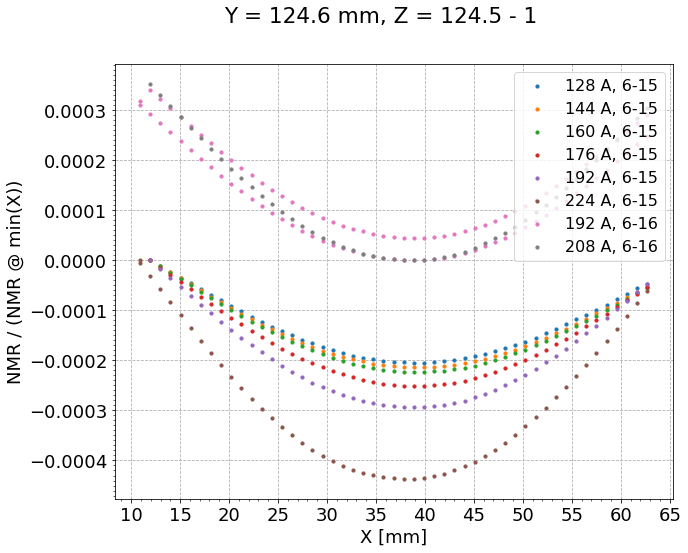

In [1451]:
fig, ax = plt.subplots()
for index, _ in enumerate(zip(currents_6_15, B_fracs, x_mms)):
    I, B, x = _
    ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
    
for index, _ in enumerate(zip(currents_6_16, B_fracs2, x_mms2)):
    I, B, x = _
    ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')

ax.xaxis.set_major_locator(MultipleLocator(5))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
ax.set_xlabel('X [mm]')
ax.set_ylabel('NMR / (NMR @ min(X))')
fig.suptitle(f'Y = {y0} mm, Z = {z0} - 1 ')
ax.legend(fontsize=16, loc='best').set_zorder(100);

In [ ]:
x_cen = 37.83
fig, ax = plt.subplots()
for index, _ in enumerate(zip(currents_6_15, B_fracs, x_mms)):
    I, B, x = _
    ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-15')
    
for index, _ in enumerate(zip(currents_6_16, B_fracs2, x_mms2)):
    I, B, x = _
    ax.scatter(x, B-1, s=10, zorder=index+10, label=f'{int(I):d} A, 6-16')

ax.xaxis.set_major_locator(MultipleLocator(5))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
ax.set_xlabel('X [mm]')
ax.set_ylabel('NMR / (NMR @ min(X))')
fig.suptitle(f'Y = {y0} mm, Z = {z0} - 1 ')
ax.legend(fontsize=16, loc='best').set_zorder(100);

In [160]:
[np.max(B) for B in B_fracs]

[1.0, 1.0, 1.0, 1.0, 1.0]

In [161]:
[np.min(B) for B in B_fracs]

[0.9995629528512809,
 0.9997951203103804,
 0.999786199785313,
 0.9997768410023578,
 0.9997483732715875]

In [1445]:
x_mms

[array([11.9359375, 12.971875 , 14.0078125, 15.04375  , 16.0796875,
        17.115625 , 18.1515625, 19.1875   , 20.2234375, 21.259375 ,
        22.2953125, 23.33125  , 24.3671875, 25.403125 , 26.4390625,
        27.475    , 28.5109375, 29.546875 , 30.5828125, 31.61875  ,
        32.6546875, 33.690625 , 34.7265625, 35.7625   , 36.7984375,
        37.834375 , 38.8703125, 39.90625  , 40.9421875, 41.978125 ,
        43.0140625, 44.05     , 45.0859375, 46.121875 , 47.1578125,
        48.19375  , 49.2296875, 50.265625 , 51.3015625, 52.3375   ,
        53.3734375, 54.409375 , 55.4453125, 56.48125  , 57.5171875,
        58.553125 , 59.5890625, 60.625    , 61.6609375, 62.696875 ]),
 array([11.9359375, 12.971875 , 14.0078125, 15.04375  , 16.0796875,
        17.115625 , 18.1515625, 19.1875   , 20.2234375, 21.259375 ,
        22.2953125, 23.33125  , 24.3671875, 25.403125 , 26.4390625,
        27.475    , 28.5109375, 29.546875 , 30.5828125, 31.61875  ,
        32.6546875, 33.690625 , 34.7265625, 35

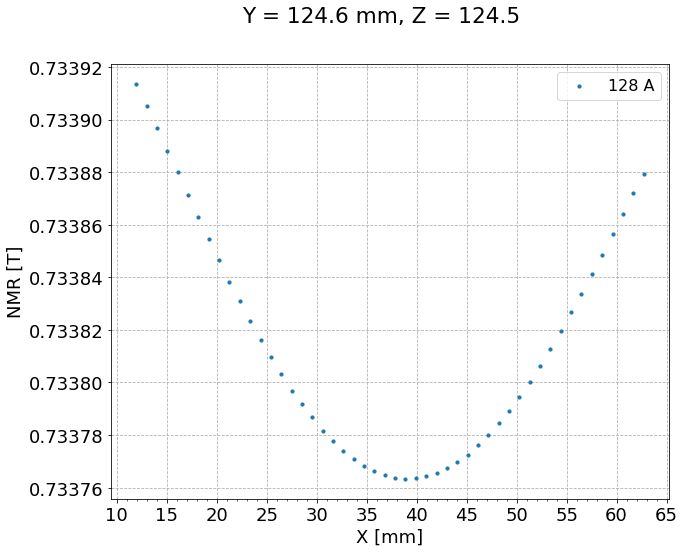

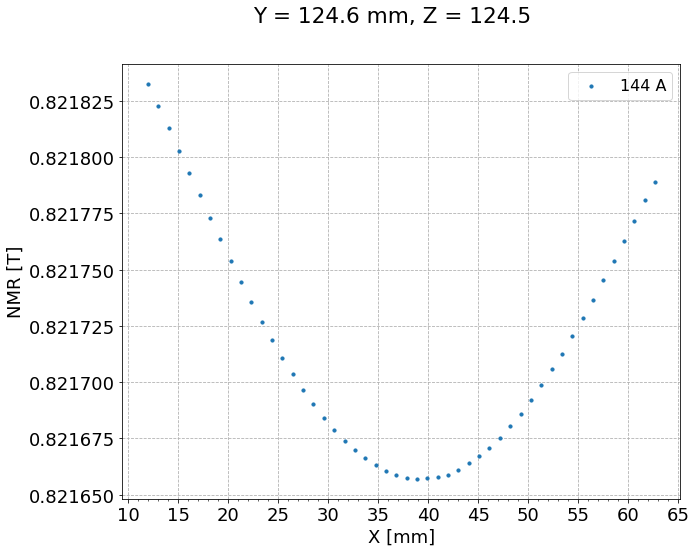

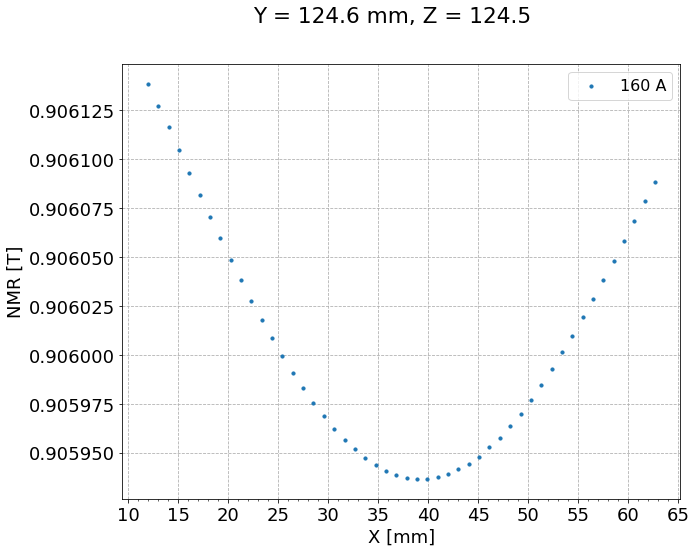

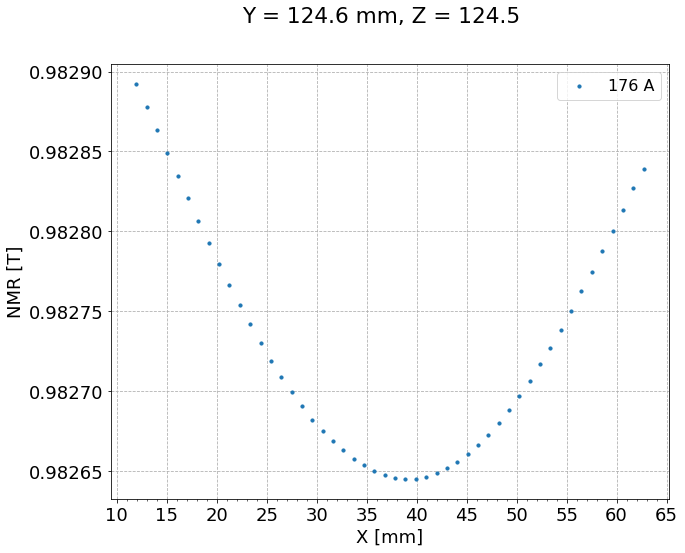

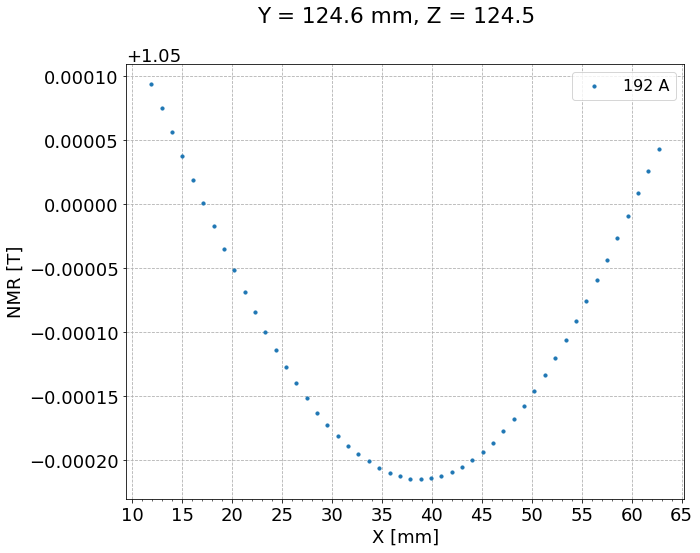

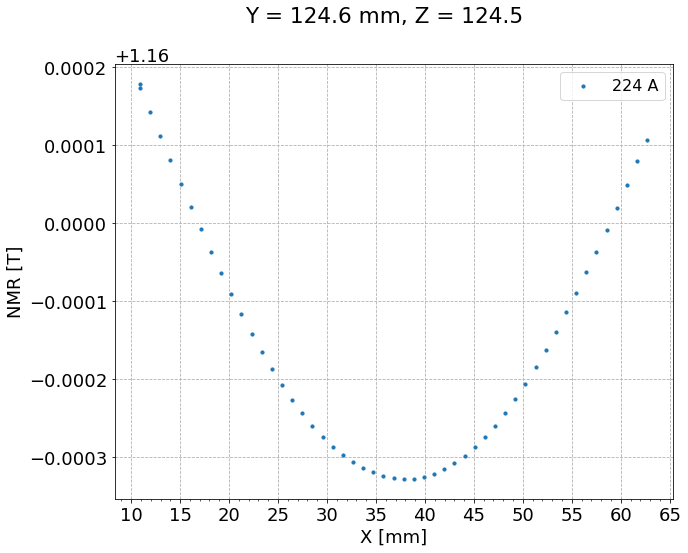

In [337]:
for index, _ in enumerate(zip(currents_6_15, B_vals, x_mms)):
    I, B, x = _
    fig, ax = plt.subplots()
    ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A')
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
#     ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
    ax.set_xlabel('X [mm]')
    ax.set_ylabel('NMR [T]')
    fig.suptitle(f'Y = {y0} mm, Z = {z0}')
    ax.legend(fontsize=16, loc='best').set_zorder(100);

In [1443]:
(x_mms[0].max() - x_mms[0].min())

50.7609375

In [1444]:
np.sin(np.radians(15.))*(x_mms[0].max() - x_mms[0].min())

13.137897372258736

In [1425]:
## dB/dx

<ipython-input-1433-34bbf92d6ec2>:6: RuntimeWarning:

divide by zero encountered in true_divide



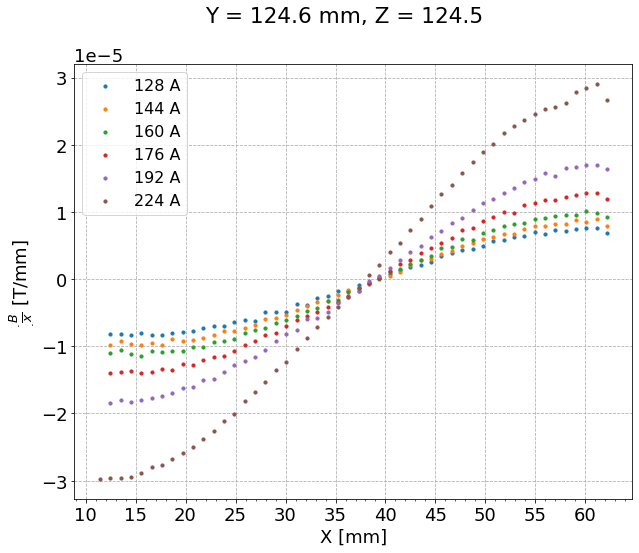

In [1433]:
fig, ax = plt.subplots()
for index, _ in enumerate(zip(currents_6_15, B_vals, x_mms)):
    I, B, x = _
    dx = np.diff(x)
    #dBdx = np.diff(B) / np.diff(x) * 1e3 # T / m
    dBdx = np.diff(B) / np.diff(x) # T / mm
    
#     fig, ax = plt.subplots()
#     ax.scatter(x, B, s=10, zorder=index+10, label=f'{int(I):d} A')
    ax.scatter(x[:-1]+dx/2., dBdx, s=10, zorder=index+10, label=f'{int(I):d} A')
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
#     ax.yaxis.set_minor_locator(MultipleLocator(1e-5))
    ax.set_xlabel('X [mm]')
    #ax.set_ylabel('NMR [T]')
#     ax.set_ylabel(r'$\frac{\d B}{\d x}$ [T/m]')
    ax.set_ylabel(r'$\frac{\d B}{\d x}$ [T/mm]')
    fig.suptitle(f'Y = {y0} mm, Z = {z0}')
    ax.legend(fontsize=16, loc='best').set_zorder(100);

In [1431]:
len(dBdx), len(x)

(49, 50)